<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Project 3

Regression and Classification with the Ames Housing Data

---

You have just joined a new "full stack" real estate company in Ames, Iowa. The strategy of the firm is two-fold:
- Own the entire process from the purchase of the land all the way to sale of the house, and anything in between.
- Use statistical analysis to optimize investment and maximize return.

The company is still small, and though investment is substantial the short-term goals of the company are more oriented towards purchasing existing houses and flipping them as opposed to constructing entirely new houses. That being said, the company has access to a large construction workforce operating at rock-bottom prices.

This project uses the [Ames housing data recently made available on kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques).

In [484]:
# Import required modules
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from pandas_summary import DataFrameSummary
# from pprint import pprint
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, cross_val_predict, train_test_split, KFold
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, Ridge, Lasso
from sklearn.metrics import mean_squared_error

plt.style.use('ggplot')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

#sns.set_style("whitegrid")

In [485]:
# Set matplotlib plotting parameters

# Resert paramaters to default, before reassigning
plt.rcParams.update(plt.rcParamsDefault)   

plt.rcParams.update({'axes.facecolor': 'white',
                     'axes.titlesize': 8,
                     'axes.edgecolor': 'black',
                     'axes.linewidth': 0.6,
                     'axes.titlepad': 8,
                     'axes.labelsize': 8,
                     'axes.labelpad': 8,
                     'xtick.labelsize':8,
                     'ytick.labelsize':8,
                     'legend.fontsize': 8,
                     'legend.edgecolor': 'black',
                     'legend.loc': 'lower right',
                     'legend.framealpha': 1 })

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## Estimating the value of homes from fixed characteristics.

---

Your superiors have outlined this year's strategy for the company:
1. Develop an algorithm to reliably estimate the value of residential houses based on *fixed* characteristics.
2. Identify characteristics of houses that the company can cost-effectively change/renovate with their construction team.
3. Evaluate the mean dollar value of different renovations.

Then we can use that to buy houses that are likely to sell for more than the cost of the purchase plus renovations.

Your first job is to tackle #1. You have a dataset of housing sale data with a huge amount of features identifying different aspects of the house. The full description of the data features can be found in a separate file:

    housing.csv
    data_description.txt
    
You need to build a reliable estimator for the price of the house given characteristics of the house that cannot be renovated. Some examples include:
- The neighborhood
- Square feet
- Bedrooms, bathrooms
- Basement and garage space

and many more. 

Some examples of things that **ARE renovateable:**
- Roof and exterior features
- "Quality" metrics, such as kitchen quality
- "Condition" metrics, such as condition of garage
- Heating and electrical components

and generally anything you deem can be modified without having to undergo major construction on the house.

---

**Your goals:**
1. Perform any cleaning, feature engineering, and EDA you deem necessary.
- Be sure to remove any houses that are not residential from the dataset.
- Identify **fixed** features that can predict price.
- Train a model on pre-2010 data and evaluate its performance on the 2010 houses.
- Characterize your model. How well does it perform? What are the best estimates of price?

> **Note:** The EDA and feature engineering component to this project is not trivial! Be sure to always think critically and creatively. Justify your actions! Use the data description file!

In [486]:
# Load housing data from csv file and store in house_df
house_df = pd.read_csv('./housing.csv')

### Initial EDA

In [487]:
# Print shape and display head of the housing data df
print(house_df.shape)
house_df.head()

(1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [488]:
# View data types and number of non-null values for each field
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

#### Subset data on residential properties only

The company is interested in residential properties only, hence non-residential properties need to be removed from the analysis.

In [489]:
# Display different 'types' of properties, indicated by the MSZoning field
print(house_df.MSZoning.unique())           # Print unique values in MSZoning field
print(house_df.MSZoning.value_counts())     # Print count of unique values in MSZoning field

['RL' 'RM' 'C (all)' 'FV' 'RH']
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64


As per the data dictionary, properties flagged as RL, RM and RH are residential.  The 10 commercial properties (flagged as 'C (all)') and 65  floating village properties (flagged as 'FV') in the MSZoning field need to be excluded form the analysis.

In [490]:
# Remove non-residential properties from df, reset df index and display new shape of df
house_df = house_df[house_df.MSZoning.isin(['RL','RM','RP','RH'])].reset_index(drop=True)
house_df.shape

(1385, 81)

The 10 commercial and 65 floating village properties have been removed from the df.

#### Continue EDA on residential properties only

In [491]:
# View data types and number of non-null values for each column (for residential properties only)
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1385 entries, 0 to 1384
Data columns (total 81 columns):
Id               1385 non-null int64
MSSubClass       1385 non-null int64
MSZoning         1385 non-null object
LotFrontage      1134 non-null float64
LotArea          1385 non-null int64
Street           1385 non-null object
Alley            65 non-null object
LotShape         1385 non-null object
LandContour      1385 non-null object
Utilities        1385 non-null object
LotConfig        1385 non-null object
LandSlope        1385 non-null object
Neighborhood     1385 non-null object
Condition1       1385 non-null object
Condition2       1385 non-null object
BldgType         1385 non-null object
HouseStyle       1385 non-null object
OverallQual      1385 non-null int64
OverallCond      1385 non-null int64
YearBuilt        1385 non-null int64
YearRemodAdd     1385 non-null int64
RoofStyle        1385 non-null object
RoofMatl         1385 non-null object
Exterior1st      1385 non-n

A few observations:
- A number of fields have null values.  These will need to be investigated and managed.
- 43 fields are type 'object'.  I'll need to confirm that this is the correct data type.

In [492]:
# Review basic summary statistics for numeric columns
house_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1385.000000,1385.000000,1134.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1380.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1306.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000
mean,732.506137,55.328520,70.583774,10706.158845,6.063538,5.607942,1970.048375,1984.121300,102.768841,450.666426,49.070036,562.882310,1062.618773,1172.896751,336.516968,5.617329,1515.031047,0.432491,0.059928,1.548736,0.368953,2.882310,1.048375,6.537906,0.627437,1977.336141,1.753791,467.954513,96.589170,43.865704,22.547292,3.594224,15.662094,2.908303,45.400722,6.314079,2007.810830,180136.283032
std,422.536319,40.883271,24.251032,10185.732173,1.373366,1.125799,29.831024,20.554236,174.373232,459.231291,165.258530,443.129021,443.785047,387.466021,436.241125,47.882723,532.739682,0.521183,0.243449,0.551509,0.500336,0.820535,0.224508,1.624029,0.649454,24.477677,0.755061,213.762881,126.994291,63.585425,62.067644,30.090182,56.883779,41.246294,509.097441,2.695583,1.326813,79906.363281
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1906.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,37900.000000
25%,365.000000,20.000000,60.000000,7711.000000,5.000000,5.000000,1953.000000,1966.000000,0.000000,0.000000,0.000000,216.000000,800.000000,892.000000,0.000000,0.000000,1120.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1960.000000,1.000000,312.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129000.000000
50%,734.000000,50.000000,70.000000,9591.000000,6.000000,5.000000,1971.000000,1992.000000,0.000000,387.000000,0.000000,470.000000,994.000000,1095.000000,0.000000,0.000000,1459.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1978.000000,2.000000,472.000000,0.000000,22.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,160000.000000
75%,1101.000000,70.000000,80.000000,11751.000000,7.000000,6.000000,1999.000000,2003.000000,168.000000,719.000000,0.000000,803.000000,1306.000000,1412.000000,720.000000,0.000000,1784.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2000.000000,2.000000,576.000000,169.000000,64.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,212900.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1378.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


### Examine SalePrice column (target variable)

Since SalePrice is the target variable, I'll start by understanding this field.

mean                                                        180136
std                                                        79906.4
variance                                               6.38503e+09
min                                                          37900
max                                                         755000
5%                                                         89476.8
25%                                                         129000
50%                                                         160000
75%                                                         212900
95%                                                         325925
iqr                                                          83900
kurtosis                                                    6.7934
skewness                                                   1.96134
sum                                                      249488752
mad                                                        575

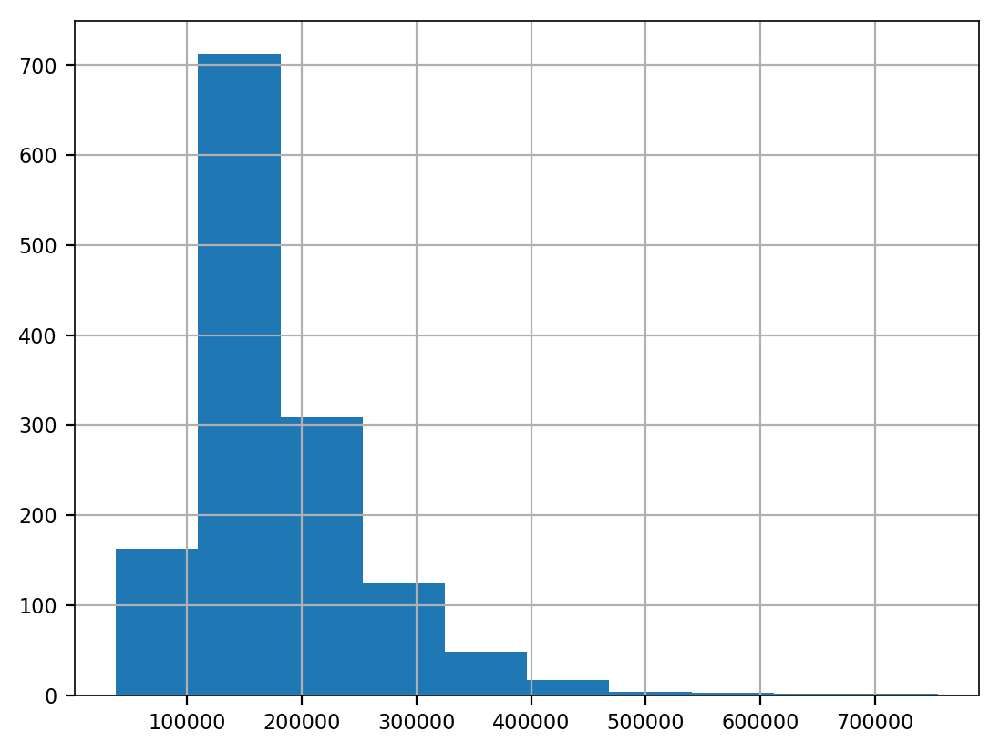

In [493]:
# Start by understanding the SalePrice column, since this is the target variable 
house_dfs = DataFrameSummary(house_df)
house_dfs['SalePrice']

<b>Initial observations:</b>
- No missing values, and the field is of type 'int'
- Mean (\$180,136) > Median / 50th percentile (\$160,000), indicating a positive skew.  This is confirmed by the positive kurtosis and skewness values, and the SalePrice histogram displayed above.
- Values range from \$37,900 to \$755,000
- There are a small number of relatively high sales prices, since the 95th percentile is considerably lower than the maximum value.

Display a boxplot of the SalePrice data.

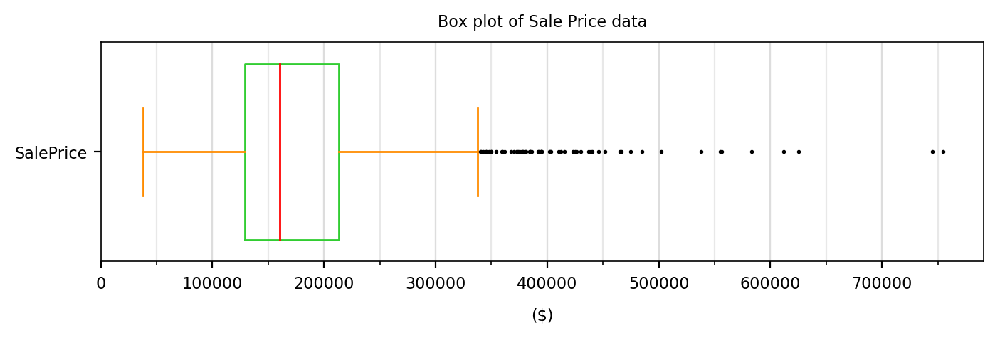

In [494]:
# Define chart title, colors and flierprops dicts
chart_title = 'Box plot of Sale Price data'
colors = dict(boxes='limegreen', whiskers='darkorange', medians='red', caps='darkorange')
flierprops = dict(marker='o', markerfacecolor='k', markersize=1)

# Display box plot of SaleProce data
ax = house_df.loc[:,['SalePrice']].plot.box(figsize = (8,2), widths = 0.8, vert=False, title = chart_title, 
                                            color=colors, whis=1.5, flierprops=flierprops)

# Add a vertical grid to the plot, but make it light in color
ax.xaxis.grid(True, linestyle='-', which='both', color='lightgrey', alpha=0.5)
ax.set_xticks(range(0,800000,50000), minor=True)
ax.set_xlabel('($)');

- Right skew of Sale Price data confirmed by boxplot.
- There are quite a few outliers i.e. sales prices greater than 1.5 times the IQR above the 75th percentile. 2 of these outliers are are considerably higher than the sales prices of all other properties.  Let's see how many outliers there are...

There are 61 houses with sales prices considered as outliers (defined here as > $338750 = Q3 + 1.5 * IQR)


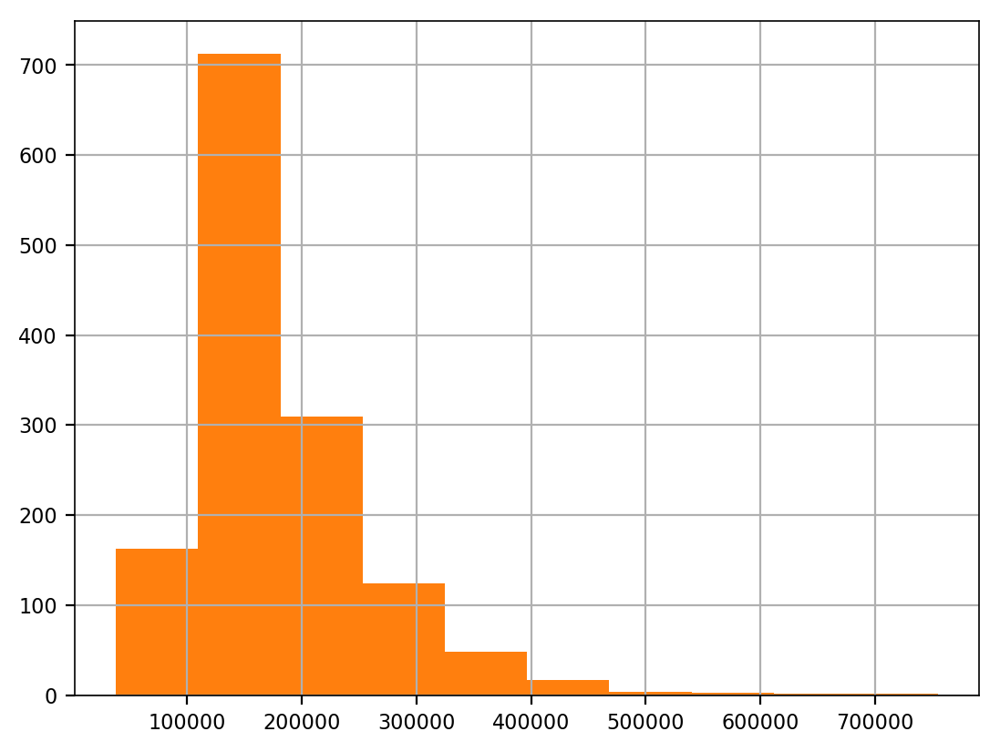

In [495]:
# Define upper_outlier_fence (i.e. 1.5 times the IQR above Q3)
iqr_sale_price = house_dfs['SalePrice']['iqr']
q3_sale_price = house_dfs['SalePrice']['75%']
upper_outlier_fence = 1.5 * iqr_sale_price + q3_sale_price

# Print number of sales prices with values exceeding the upper outlier fence
mask = house_df['SalePrice'] > upper_outlier_fence
print(f"There are {mask.sum()} houses with sales prices considered as outliers \
(defined here as > ${int(upper_outlier_fence)} = Q3 + 1.5 * IQR)")

### Examine numeric, fixed features

#### Derive 2 new columns

In [496]:
# Derive and add 2 new columns of interest: 
# 1) Age (years + months) of property when sold, 
# 2) Age (years) of renovation when sold

# Calculate the age of the house when sold
house_df['AgeSold'] = (house_df.YrSold + (house_df.MoSold-1)/12.) - house_df.YearBuilt

# Calculate the age of house remodel when sold
house_df['RemodAgeSold'] = house_df.YrSold - house_df.YearRemodAdd

#### Numeric, fixed feature analysis

In [497]:
# Define dictionary of column indexes for ease of identification
col_indexes = dict(enumerate(house_df.columns)) 
print(col_indexes)

{0: 'Id', 1: 'MSSubClass', 2: 'MSZoning', 3: 'LotFrontage', 4: 'LotArea', 5: 'Street', 6: 'Alley', 7: 'LotShape', 8: 'LandContour', 9: 'Utilities', 10: 'LotConfig', 11: 'LandSlope', 12: 'Neighborhood', 13: 'Condition1', 14: 'Condition2', 15: 'BldgType', 16: 'HouseStyle', 17: 'OverallQual', 18: 'OverallCond', 19: 'YearBuilt', 20: 'YearRemodAdd', 21: 'RoofStyle', 22: 'RoofMatl', 23: 'Exterior1st', 24: 'Exterior2nd', 25: 'MasVnrType', 26: 'MasVnrArea', 27: 'ExterQual', 28: 'ExterCond', 29: 'Foundation', 30: 'BsmtQual', 31: 'BsmtCond', 32: 'BsmtExposure', 33: 'BsmtFinType1', 34: 'BsmtFinSF1', 35: 'BsmtFinType2', 36: 'BsmtFinSF2', 37: 'BsmtUnfSF', 38: 'TotalBsmtSF', 39: 'Heating', 40: 'HeatingQC', 41: 'CentralAir', 42: 'Electrical', 43: '1stFlrSF', 44: '2ndFlrSF', 45: 'LowQualFinSF', 46: 'GrLivArea', 47: 'BsmtFullBath', 48: 'BsmtHalfBath', 49: 'FullBath', 50: 'HalfBath', 51: 'BedroomAbvGr', 52: 'KitchenAbvGr', 53: 'KitchenQual', 54: 'TotRmsAbvGrd', 55: 'Functional', 56: 'Fireplaces', 57: 'F

In [498]:
# Define list of column of indexes of numeric, fixed features of interest for predicting sales price, 
# based on col_indexes dictionary above
ff_col_index = [3, 4, 19, 20, 26, 34, 36, 37, 38, 43, 44, 45, 46, 47, 48, 49, 50, 
                51, 52, 54, 56, 61, 62, 66, 67, 68, 69, 70, 71, 75, 76, 77, 81, 82]

# Define data frame with quantifable, fixed features for residential properties only
house_ff = house_df.iloc[:,ff_col_index]

In [499]:
# Inspect head of numeric, fixed feature house data to confirm correct field selection
house_ff.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,AgeSold,RemodAgeSold
0,65.0,8450,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2,548,0,61,0,0,0,0,0,2,2008,5.083333,5
1,80.0,9600,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,2,460,298,0,0,0,0,0,0,5,2007,31.333333,31
2,68.0,11250,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2,608,0,42,0,0,0,0,0,9,2008,7.666667,6
3,60.0,9550,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,3,642,0,35,272,0,0,0,0,2,2006,91.083333,36
4,84.0,14260,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,3,836,192,84,0,0,0,0,0,12,2008,8.916667,8


All fields confirmed as fixed and numeric features. 

The AgeSold and RemodAgeSold columns have also been correctly calculated.

#### Continue EDA on numeric, fixed features for residential properties only

In [500]:
# Examine quality of fixed feature data
house_ff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1385 entries, 0 to 1384
Data columns (total 34 columns):
LotFrontage      1134 non-null float64
LotArea          1385 non-null int64
YearBuilt        1385 non-null int64
YearRemodAdd     1385 non-null int64
MasVnrArea       1380 non-null float64
BsmtFinSF1       1385 non-null int64
BsmtFinSF2       1385 non-null int64
BsmtUnfSF        1385 non-null int64
TotalBsmtSF      1385 non-null int64
1stFlrSF         1385 non-null int64
2ndFlrSF         1385 non-null int64
LowQualFinSF     1385 non-null int64
GrLivArea        1385 non-null int64
BsmtFullBath     1385 non-null int64
BsmtHalfBath     1385 non-null int64
FullBath         1385 non-null int64
HalfBath         1385 non-null int64
BedroomAbvGr     1385 non-null int64
KitchenAbvGr     1385 non-null int64
TotRmsAbvGrd     1385 non-null int64
Fireplaces       1385 non-null int64
GarageCars       1385 non-null int64
GarageArea       1385 non-null int64
WoodDeckSF       1385 non-null int64
O

In [501]:
house_ff.describe()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,AgeSold,RemodAgeSold
count,1134.000000,1385.000000,1385.000000,1385.000000,1380.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000
mean,70.583774,10706.158845,1970.048375,1984.121300,102.768841,450.666426,49.070036,562.882310,1062.618773,1172.896751,336.516968,5.617329,1515.031047,0.432491,0.059928,1.548736,0.368953,2.882310,1.048375,6.537906,0.627437,1.753791,467.954513,96.589170,43.865704,22.547292,3.594224,15.662094,2.908303,45.400722,6.314079,2007.810830,38.205295,23.689531
std,24.251032,10185.732173,29.831024,20.554236,174.373232,459.231291,165.258530,443.129021,443.785047,387.466021,436.241125,47.882723,532.739682,0.521183,0.243449,0.551509,0.500336,0.820535,0.224508,1.624029,0.649454,0.755061,213.762881,126.994291,63.585425,62.067644,30.090182,56.883779,41.246294,509.097441,2.695583,1.326813,29.871412,20.544089
min,21.000000,1300.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,0.000000,-1.000000
25%,60.000000,7711.000000,1953.000000,1966.000000,0.000000,0.000000,0.000000,216.000000,800.000000,892.000000,0.000000,0.000000,1120.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,312.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,9.500000,5.000000
50%,70.000000,9591.000000,1971.000000,1992.000000,0.000000,387.000000,0.000000,470.000000,994.000000,1095.000000,0.000000,0.000000,1459.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,472.000000,0.000000,22.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,37.000000,16.000000
75%,80.000000,11751.000000,1999.000000,2003.000000,168.000000,719.000000,0.000000,803.000000,1306.000000,1412.000000,720.000000,0.000000,1784.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,169.000000,64.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,55.750000,42.000000
max,313.000000,215245.000000,2010.000000,2010.000000,1378.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,136.916667,60.000000


Initial inspection suggests most data is complete and of the data type expected.
There are some null values in LotFrontage and MasVnrArea columns to understand.
No concerns on min/max/mean for the columns above

#####  Data Cleaning: LotFrontage NaN values

In [502]:
# Display unique values in LotFrontage field
house_ff.LotFrontage.unique()

array([ 65.,  80.,  68.,  60.,  84.,  85.,  75.,  nan,  51.,  50.,  70.,
        91.,  72.,  66., 101.,  57.,  44., 110.,  98.,  47., 108., 112.,
        74., 115.,  61.,  48.,  33.,  52., 100.,  89.,  63.,  76.,  81.,
        95.,  69.,  21.,  32.,  78., 121., 122.,  73.,  77.,  64.,  94.,
       105.,  90.,  55.,  88.,  82.,  71.,  24., 120., 107.,  92., 134.,
        40.,  62.,  86., 141.,  97.,  54.,  41.,  79., 174.,  99.,  67.,
        83.,  43., 103.,  93.,  30., 129., 140.,  34.,  37., 118.,  87.,
       116., 150., 111.,  49.,  96.,  59.,  36.,  56.,  58.,  38., 109.,
       130.,  53., 137.,  35.,  45., 106., 104.,  42.,  39., 144., 114.,
       102., 128., 149., 313., 168., 182., 138., 160., 152., 124., 153.,
        46.])

In [503]:
# Print min and max values of LotFrontage field
print(np.min(house_ff.LotFrontage), np.max(house_ff.LotFrontage))

21.0 313.0


No zero LotFrontage values.  
Perhaps these NaNs should be 0, because these houses don't have LotFrontage i.e. no linear feet of street
connected to property.

I'll investigate the NaN values in the context of all fields within dataset to help understand why they may be NaN.

In [504]:
# Print number of rows with NaN LotFrontage and display 5 rows of house data where LotFrontage is NaN
mask=house_df.LotFrontage.isnull()
print(f"{mask.sum()} properties have LotFrontage = NaN")
house_df[mask].head()

251 properties have LotFrontage = NaN


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeSold,RemodAgeSold
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000,36.833333,36
12,13,20,RL,NaN,12968,Pave,NaN,IR2,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1962,1962,Hip,CompShg,HdBoard,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,737,Unf,0,175,912,GasA,TA,Y,SBrkr,912,0,0,912,1,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1962.0,Unf,1,352,TA,TA,Y,140,0,0,0,176,0,NaN,NaN,NaN,0,9,2008,WD,Normal,144000,46.666667,46
14,15,20,RL,NaN,10920,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1960,1960,Hip,CompShg,MetalSd,MetalSd,BrkFace,212.0,TA,TA,CBlock,TA,TA,No,BLQ,733,Unf,0,520,1253,GasA,TA,Y,SBrkr,1253,0,0,1253,1,0,1,1,2,1,TA,5,Typ,1,Fa,Attchd,1960.0,RFn,1,352,TA,TA,Y,0,213,176,0,0,0,NaN,GdWo,NaN,0,5,2008,WD,Normal,157000,48.333333,48
16,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,7,1970,1970,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,ALQ,578,Unf,0,426,1004,GasA,Ex,Y,SBrkr,1004,0,0,1004,1,0,1,0,2,1,TA,5,Typ,1,TA,Attchd,1970.0,Fin,2,480,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal,149000,40.166667,40
24,25,20,RL,NaN,8246,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,8,1968,2001,Gable,CompShg,Plywood,Plywood,None,0.0,TA,Gd,CBlock,TA,TA,Mn,Rec,188,ALQ,668,204,1060,GasA,Ex,Y,SBrkr,1060,0,0,1060,1,0,1,0,3,1,Gd,6,Typ,1,TA,Attchd,1968.0,Unf,1,270,TA,TA,Y,406,90,0,0,0,0,NaN,MnPrv,NaN,0,5,2010,WD,Normal,154000,42.333333,9


Review LotConfig of the 251 properties with NaN LotFrontage.  Perhaps only Inside lots have null LotFrontage?

In [505]:
# Print LotConfig value counts where LotFrontage is NaN
house_df.loc[mask,'LotConfig'].value_counts()

Inside     128
Corner      62
CulDSac     49
FR2         12
Name: LotConfig, dtype: int64

Unable to conclude why 251 homes have NaN for LotFrontage.  I will set these to 0,
based on an educated guess that these homes do not have street frontage, and the fact that 
the LotFrontage field doesn't currently contain any 0 values.

In [506]:
# Set NaN LotFrontage values to 0 in both house and fixed feature dfs
house_df = house_df.copy()
house_df.loc[mask,'LotFrontage'] = 0.

mask = house_ff.LotFrontage.isnull()
house_ff = house_ff.copy()
house_ff.loc[mask,'LotFrontage'] = 0.

print(f'LotFrontage now contains {house_ff.LotFrontage.isnull().sum()} NaN values')

LotFrontage now contains 0 NaN values


##### Data Cleaning: MasVnrArea NaN values

In [507]:
# Display house data where MasVnrArea field is NaN
mask = house_df.MasVnrArea.isnull()
house_df[mask]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeSold,RemodAgeSold
223,235,60,RL,0.0,7851,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,625,Unf,0,235,860,GasA,Ex,Y,SBrkr,860,1100,0,1960,1,0,2,1,4,1,Gd,8,Typ,2,TA,BuiltIn,2002.0,Fin,2,440,TA,TA,Y,288,48,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal,216500,8.333333,8
500,530,20,RL,0.0,32668,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Crawfor,Norm,Norm,1Fam,1Story,6,3,1957,1975,Hip,CompShg,Wd Sdng,Stone,NaN,NaN,Gd,TA,PConc,TA,TA,No,Rec,1219,Unf,0,816,2035,GasA,TA,Y,SBrkr,2515,0,0,2515,1,0,3,0,4,2,TA,9,Maj1,2,TA,Attchd,1975.0,RFn,2,484,TA,TA,Y,0,0,200,0,0,0,NaN,NaN,NaN,0,3,2007,WD,Alloca,200624,50.166667,32
883,937,20,RL,67.0,10083,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,833,Unf,0,343,1176,GasA,Ex,Y,SBrkr,1200,0,0,1200,1,0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,2003.0,RFn,2,555,TA,TA,Y,0,41,0,0,0,0,NaN,NaN,NaN,0,8,2009,WD,Normal,184900,6.583333,6
1178,1244,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,10,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Ex,TA,PConc,Ex,Gd,Gd,GLQ,1386,Unf,0,690,2076,GasA,Ex,Y,SBrkr,2076,0,0,2076,1,0,2,1,2,1,Ex,7,Typ,1,Gd,Attchd,2006.0,Fin,3,850,TA,TA,Y,216,229,0,0,0,0,NaN,NaN,NaN,0,9,2006,New,Partial,465000,0.666667,0
1211,1279,60,RL,75.0,9473,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,8,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,804,Unf,0,324,1128,GasA,Ex,Y,SBrkr,1128,903,0,2031,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2002.0,RFn,2,577,TA,TA,Y,0,211,0,0,0,0,NaN,NaN,NaN,0,3,2008,WD,Normal,237000,6.166667,6


The EDA above shows that the MasVnrArea field is null where the MasVnrType field is also null.

In [508]:
# Print unique values for MasVnrType field and print value counts (for non-null values)
print(house_df.MasVnrType.unique())

print(house_df.MasVnrType.value_counts())

['BrkFace' 'None' 'Stone' 'BrkCmn' nan]
None       816
BrkFace    432
Stone      117
BrkCmn      15
Name: MasVnrType, dtype: int64


In [509]:
# Set MasVnrTpe to None and MasVnrArea to 0 for these houses in both the full DF (house_df) and 
# the subset DF of fixed features (house_ff)
house_df.loc[mask,'MasVnrType'] = 'None'
house_df.loc[mask,'MasVnrArea'] = 0

mask = house_ff.MasVnrArea.isnull()
house_ff.loc[mask,'MasVnrArea'] = 0

In [510]:
# Verify cleansing of MasVnrType and MasVnrArea fields
print(f'MasVnrType value counts:\n{house_df.MasVnrType.value_counts()}')
print(f'\n MasVnrArea NaN values in house data: {house_df.MasVnrArea.isnull().sum()}')
print(f'\n MasVnrArea NaN values in numerical, fixed feature house data: {house_ff.MasVnrArea.isnull().sum()}')

MasVnrType value counts:
None       821
BrkFace    432
Stone      117
BrkCmn      15
Name: MasVnrType, dtype: int64

 MasVnrArea NaN values in house data: 0

 MasVnrArea NaN values in numerical, fixed feature house data: 0


In [511]:
# Print house_ff info to verify completion of cleaning
house_ff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1385 entries, 0 to 1384
Data columns (total 34 columns):
LotFrontage      1385 non-null float64
LotArea          1385 non-null int64
YearBuilt        1385 non-null int64
YearRemodAdd     1385 non-null int64
MasVnrArea       1385 non-null float64
BsmtFinSF1       1385 non-null int64
BsmtFinSF2       1385 non-null int64
BsmtUnfSF        1385 non-null int64
TotalBsmtSF      1385 non-null int64
1stFlrSF         1385 non-null int64
2ndFlrSF         1385 non-null int64
LowQualFinSF     1385 non-null int64
GrLivArea        1385 non-null int64
BsmtFullBath     1385 non-null int64
BsmtHalfBath     1385 non-null int64
FullBath         1385 non-null int64
HalfBath         1385 non-null int64
BedroomAbvGr     1385 non-null int64
KitchenAbvGr     1385 non-null int64
TotRmsAbvGrd     1385 non-null int64
Fireplaces       1385 non-null int64
GarageCars       1385 non-null int64
GarageArea       1385 non-null int64
WoodDeckSF       1385 non-null int64
O

I'm now happy with the quality of my fixed feature data in the house_ff DF

### Investigate correlations between numerical, fixed features and sales price

In [512]:
# Define function to generate a correlation heatmap, accepting a DF and correlation method as arguments

def correlation_heat_map(df, corr_method):
    '''This function accepts a dataframe and correlation method string (e.g. 'pearson' or 
    'spearman') and displays the correlation heatmap for the numeric data within the dataframe'''
    
    # Define correlation dataframe, using the corr_method argument
    corrs = df.corr(method=corr_method)

    # Set the default matplotlib figure size:
    fig, ax = plt.subplots(figsize=(40,40))
    
    # Generate a mask for the upper triangle
    mask = np.zeros_like(corrs, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Define title string
    title = f'Heatmap of {corr_method} correlation between numeric fixed features and sales price'
    
    # Plot the heatmap with seaborn
    ax = sns.heatmap(corrs, mask=mask, annot=True, fmt='.2f', annot_kws={'size':18},
                     cmap='RdBu_r', center=0, vmin=-1, vmax=1, cbar_kws={'shrink': 0.8})
    ax.set_title(title, fontsize=28)
    
    # Resize the labels.
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=20, rotation=60)
    ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=20, rotation=0)
    
    # Change font size of colormap
    cax = plt.gcf().axes[-1]
    cax.tick_params(labelsize=20) ;

##### Observations from Pearson correlation heatmap
    

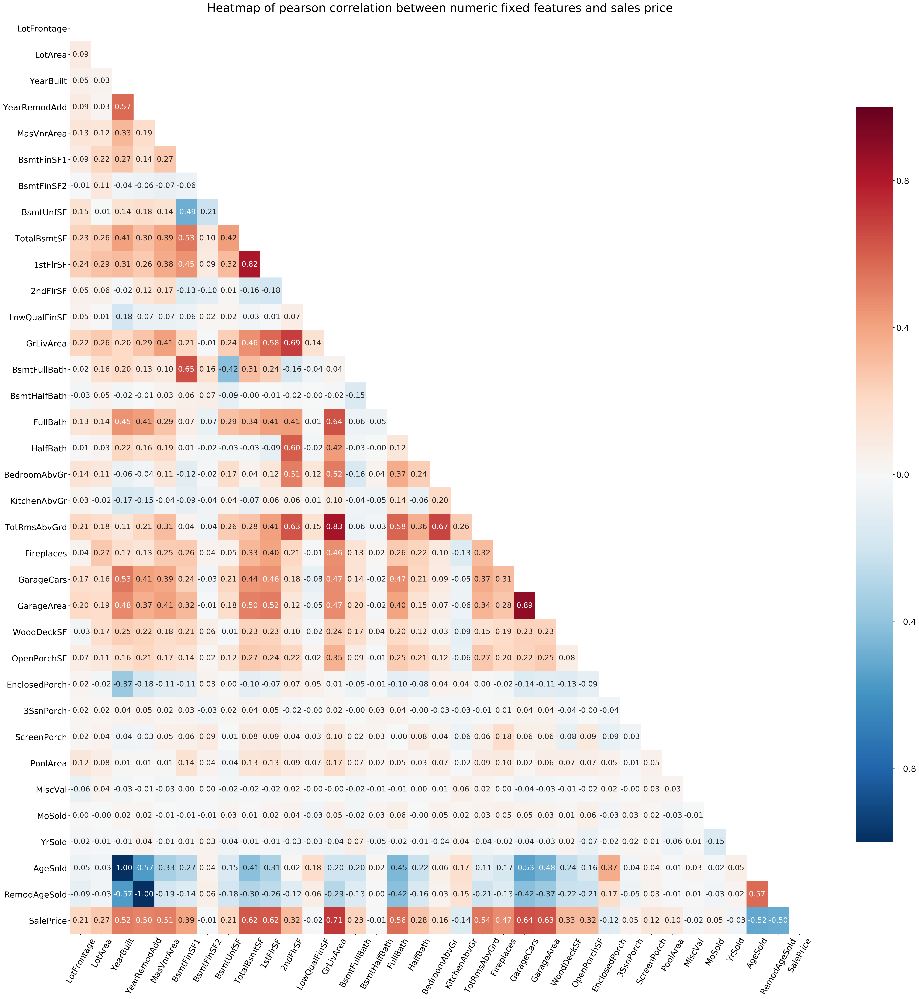

In [513]:
# Call function to generate pearson correlation heatmap for numeric, fixed feature data
# concatenated with SalePrice
correlation_heat_map(pd.concat([house_ff, house_df.SalePrice], axis=1), 'pearson')

Person correlation > +- 0.5 between SalePrice and:
- YearBuilt/AgeSold (+/-0.52)
- YearRemodAdd/RemodAgeSold (+/- 0.5)
- MasVnrArea (0.51)
- TotalBsmtSF (0.62)
- 1stFlrSF (0.62)
- GrLivArea (0.71)
- FullBath (0.56)
- TotRmsAbvGrd (0.54)
- GarageCars (0.64)
- GarageArea (0.63)

Lets' now look at intercorrelations between these variables:
- YearBuilt/AgeSold is equivalent to the same field.  I'll only include the 'YearBuilt' field in my predictor list.
- YearRemodAdd/RemodAgeSold is equivalent to the same field.  I'll only include 1 of these fields, if either.
- YearBuilt/YearRemoddAdd has a relatively high correlation (0.57). I'll only include 1 of these fields in model.  YearRemodAdd appears less correlated with other variables, so I'm going to choose this - even though its correlation with sales price is slightly less than YearBuilt.
- TotalBsmtSF is highly correlated with 1stFlrSF (0.82).  I'll only include TotalBsmtSF in model.
- GrLivArea is highly correlated with TotRmsAbvGrd (0.83).  I'll only include GRLivArea in model, as this has the higher correlation with SalePrice. My feeling is that GRLivArea will also reprsent the space of those houses that have 0 basement space.
- FullBath has highest correlation with GrLivArea and TotRmsAbveGrd (to be excluded from model).  I'll include this, as the field feels like it may capture different features to the GRLivArea field.
- GarageCars and GarageArea have an understandably high correlation (0.89). I'll only include GarageCars, as it feels like this variable captures the functional nature of the garage.

A lot of the variables proposed for inclusion in my predictors above are related to space, and I'd like to include some non-space related predictors in my model to reflect specific features that may influence the sales price.  Based on the correlation heatmap above, I'm going to include Fireplaces (correlation 0.47), WoodDeckSF (correlation 0.33) and OpenPorchSF (correlation 0.32).  These predictors reflect specific features and have minimal correlation with other predictors.

In [514]:
# Assign list of numerical predictors based on analysis of correlation data above
predictors_num = ['YearRemodAdd', 'TotalBsmtSF', 'GrLivArea', 'FullBath', 
              'GarageCars', 'Fireplaces', 'WoodDeckSF', 'OpenPorchSF' ]

Review descriptive statistics of these numerical predictors to ensure there are no surprises.

In [515]:
# Display descriptive statistics of selected numerical features
house_ff[predictors_num].describe()

,YearRemodAdd,TotalBsmtSF,GrLivArea,FullBath,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF
count,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000
mean,1984.121300,1062.618773,1515.031047,1.548736,1.753791,0.627437,96.589170,43.865704
std,20.554236,443.785047,532.739682,0.551509,0.755061,0.649454,126.994291,63.585425
min,1950.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1966.000000,800.000000,1120.000000,1.000000,1.000000,0.000000,0.000000,0.000000
50%,1992.000000,994.000000,1459.000000,2.000000,2.000000,1.000000,0.000000,22.000000
75%,2003.000000,1306.000000,1784.000000,2.000000,2.000000,1.000000,169.000000,64.000000
max,2010.000000,6110.000000,5642.000000,3.000000,4.000000,3.000000,857.000000,547.000000


In [516]:
house_df.OpenPorchSF.describe()

count    1385.000000
mean       43.865704
std        63.585425
min         0.000000
25%         0.000000
50%        22.000000
75%        64.000000
max       547.000000
Name: OpenPorchSF, dtype: float64

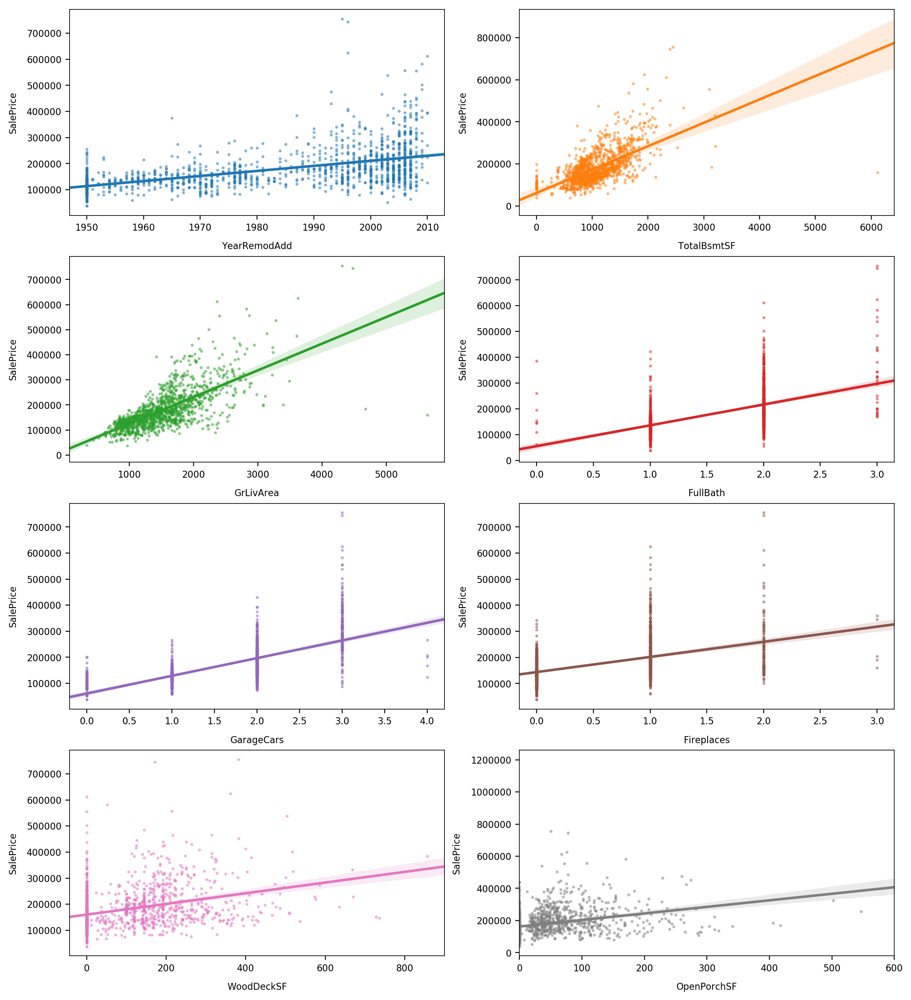

In [517]:
# Plot relationship between predictors and sales price to confirm linear relationship visually
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(13,15))

scatter_dict = {'s':3, 'alpha':0.4}
sns.regplot('YearRemodAdd','SalePrice', house_df, ax=ax[0,0], scatter_kws=scatter_dict) 
sns.regplot('TotalBsmtSF','SalePrice', house_df, ax=ax[0,1], scatter_kws=scatter_dict) 
sns.regplot('GrLivArea','SalePrice', house_df, ax=ax[1,0], scatter_kws=scatter_dict) 
sns.regplot('FullBath','SalePrice', house_df, ax=ax[1,1], scatter_kws=scatter_dict) 
sns.regplot('GarageCars','SalePrice', house_df, ax=ax[2,0], scatter_kws=scatter_dict) 
sns.regplot('Fireplaces','SalePrice', house_df, ax=ax[2,1], scatter_kws=scatter_dict) 
sns.regplot('WoodDeckSF','SalePrice', house_df, ax=ax[3,0], scatter_kws=scatter_dict) 
sns.regplot('OpenPorchSF','SalePrice', house_df, ax=ax[3,1], scatter_kws=scatter_dict) 

# ax[0,1].set_xlim(0,3000)           # I've intentionally restricted some axes (excluding some outliers) 
# ax[0,1].set_xlim(0,3000)           # to enable me to see the relationship more clearly 
# ax[1,0].set_xlim(0,4000)
# ax[3,0].set_xlim(0,600)
ax[3,1].set_xlim(0,600)  ;

There is clearly some strong signal between the selected numerical features and the sale price.

There is one property that has a very high TotalBsmtSF value.  I'm going to investigate this.

In [518]:
# Display data for property with extremely high TotalBsmtSF value
house_df[house_df.TotalBsmtSF == np.max(house_df.TotalBsmtSF)]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeSold,RemodAgeSold
1230,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,5644,Unf,0,466,6110,GasA,Ex,Y,SBrkr,4692,950,0,5642,2,0,2,1,3,1,Ex,12,Typ,3,Gd,Attchd,2008.0,Fin,2,1418,TA,TA,Y,214,292,0,0,0,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000,0.0,0


As can be seen from the data above, this is the same property with the very high GrLivArea value (easily seen as an outlier in the chart above).  I'm going to drop this property from the analysis as it doesn't feel comparable with the other properties.

In [519]:
# Drop property with outlier value for TotalBsmtSF and reset index, in both house and fixed feature dfs
house_df.drop(index=1230, inplace=True)
house_df.reset_index(inplace=True)

house_ff.drop(index=1230, inplace=True)
house_ff.reset_index(inplace=True)

##### Observations from Spearman correlation heatmap

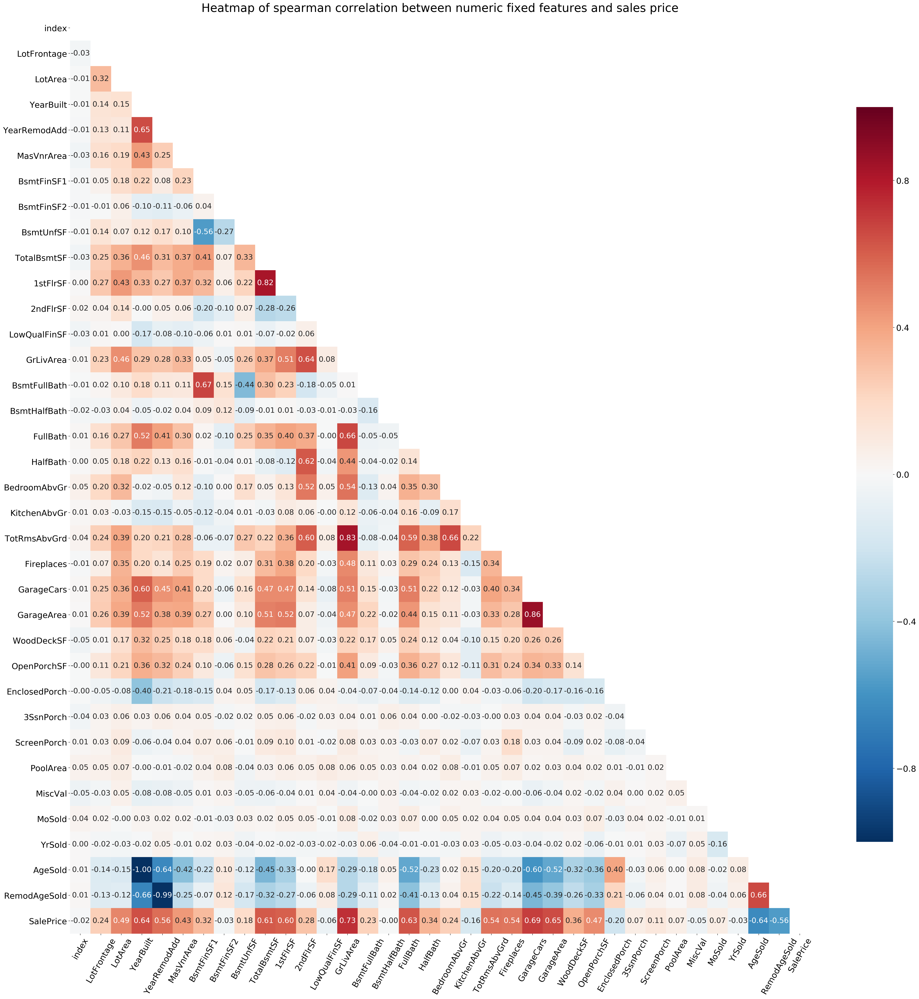

In [520]:
# Call function to generate spearman correlation heatmap to see if we can identify any linear relationships with 
# non-uniform rates of change
correlation_heat_map(pd.concat([house_ff, house_df.SalePrice], axis=1), 'spearman')

The spearman correlation heatmap supports my predictor selection from the previous section.  A couple of predictors have seen reasonably significant increases in their correlation with the sales price, as a result of considering the Spearman correlation.  These are LotArea and OpenPorchSF.  Would be good to plot the relationship between these fields and the saleprice to see if we can identify a suitable polynomial transformation for them to include in the model.

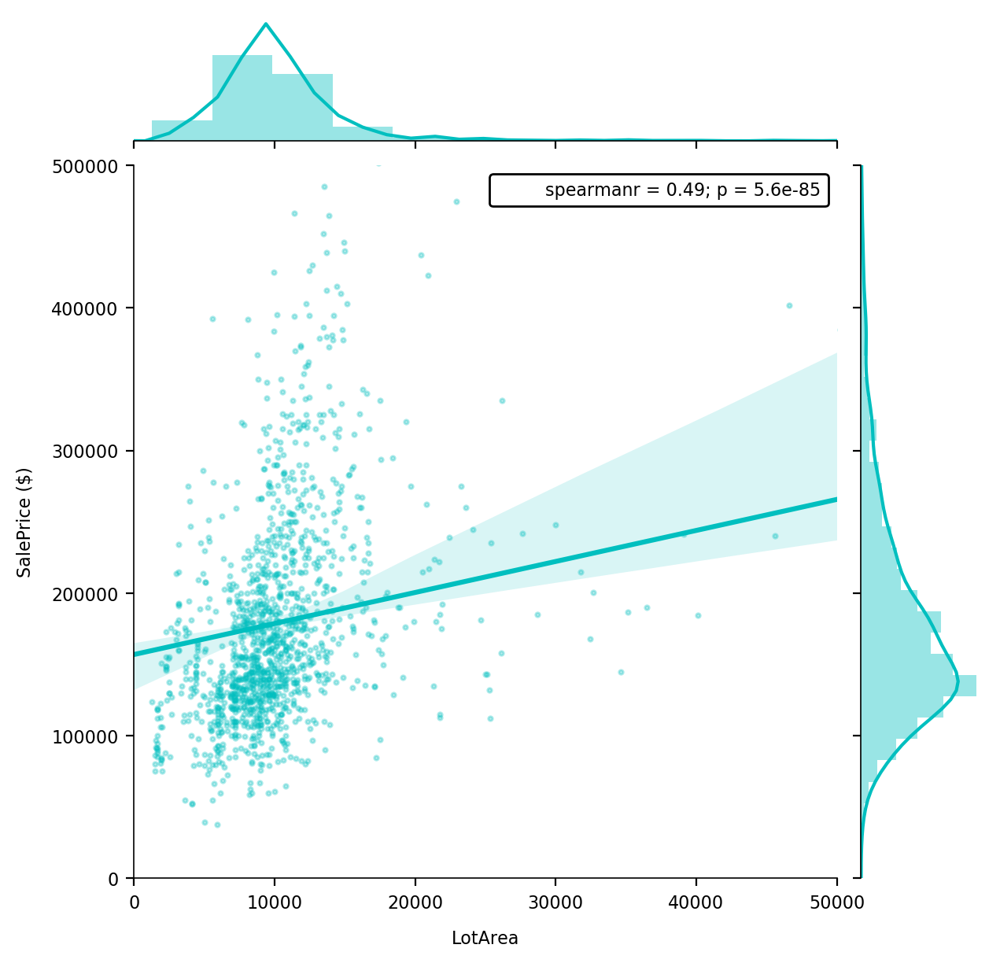

In [524]:
# Plot SalePrice vs LotArea
sns.jointplot(house_df['LotArea'].values, house_df['SalePrice'].values, size=6, 
              color='c', kind='reg', stat_func=stats.spearmanr, scatter_kws={'s':4, 'alpha':0.3}) ;

plt.xlabel('LotArea')
plt.xticks()

plt.ylabel('SalePrice ($)')
plt.yticks()
plt.ylim(0, 500000)                     # Zoom in on area with vast majority of data points to observe relationship
plt.xlim(0, 50000)  ;

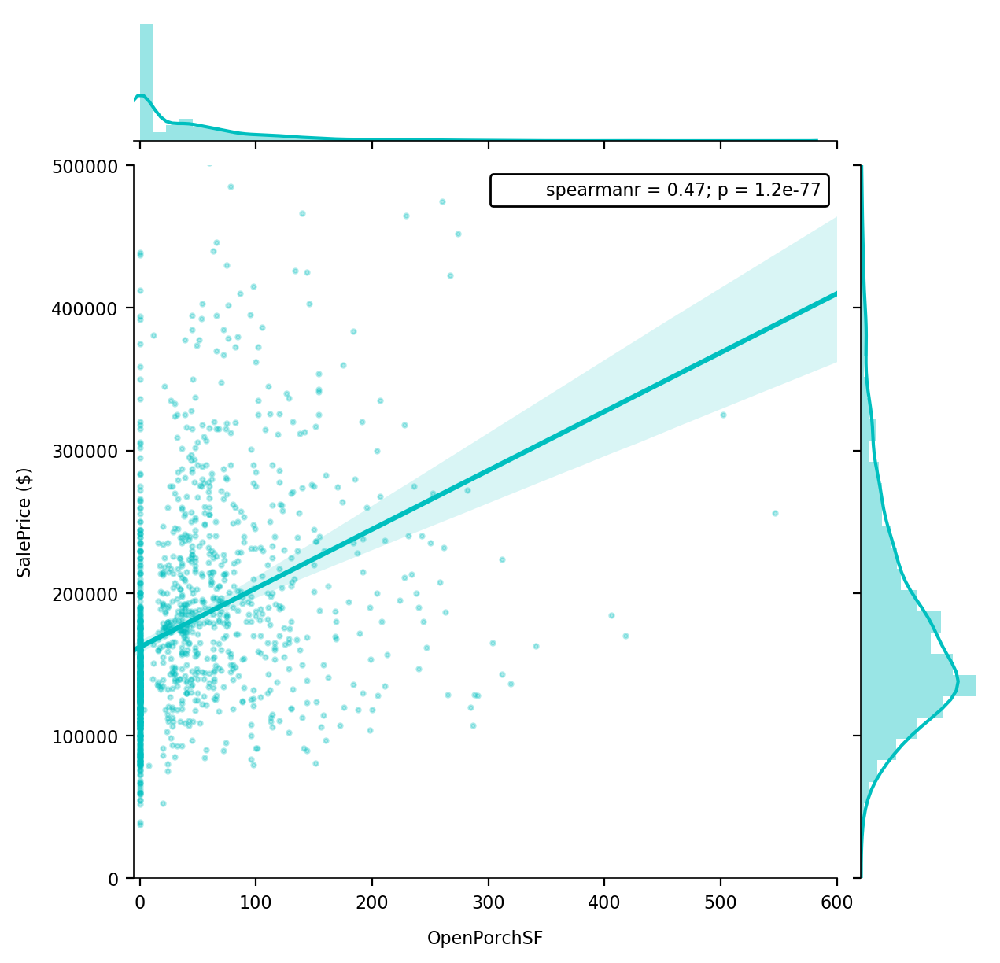

In [528]:
# Plot SalePrice vs OpenPorchSF

sns.jointplot(house_df['OpenPorchSF'].values, house_df['SalePrice'].values, size=6, 
              color='c', kind='reg', stat_func=stats.spearmanr, scatter_kws={'s':4, 'alpha':0.3}) ;

plt.xlabel('OpenPorchSF')
plt.xticks()

plt.ylabel('SalePrice ($)')
plt.yticks()
plt.ylim(0, 500000)  ;                   # Zoom in on area with vast majority of data points to observe relationship
plt.xlim(-5, 600) ;

I could have potentially done a polynomial transform on these (potential) predictors and included them in my 
model, but I don't feel the linear correlation is strong enough to justify it.

### Investigate relationship between categorical variables for fixed features, and the sales price

#### Neighborhood investigation

Neighborhood feels like a field to immediately investigate.

In [529]:
# Display number of unique neighborhoods
house_df['Neighborhood'].nunique()

25

In [531]:
# Confirm no null values
house_df['Neighborhood'].isnull().sum()

0

In [532]:
# Display number of properties for each neighborhood
house_df['Neighborhood'].value_counts()

NAmes      225
CollgCr    150
OldTown    112
Edwards     99
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      28
ClearCr     28
StoneBr     25
SWISU       25
Somerst     21
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64

There are no identified data cleaning requirements, and there is a good distribution of properties across neighborhoods.

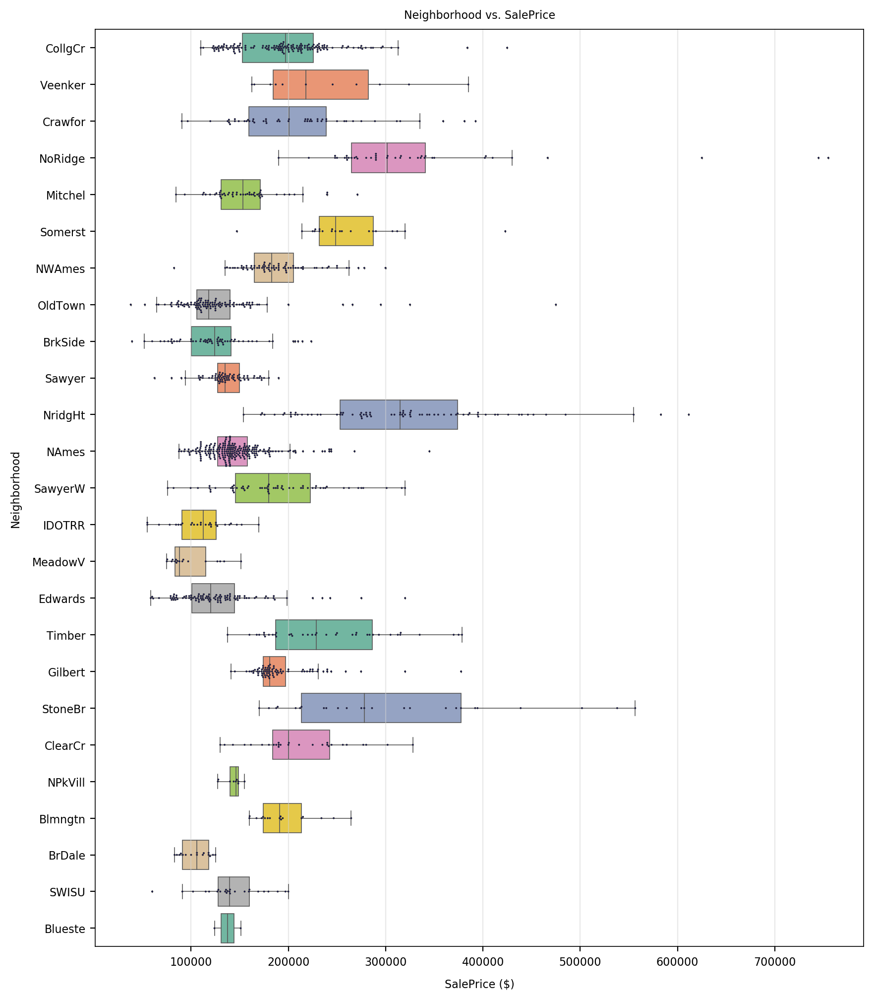

In [726]:
# Plot a box and swarm plot of Neighborhood vs. SalePrice
fig, ax = plt.subplots(figsize=(10,12))
y_axis = 'Neighborhood'
x_axis = 'SalePrice'

ax = sns.boxplot(x=x_axis, y=y_axis, data=house_df, linewidth=0.6, orient='h', fliersize=0.2, palette='Set2')
ax = sns.swarmplot(x=x_axis, y=y_axis, data=house_df, linewidth=0.4, size=1, color='darkblue')

# Add a vertical grid to the plot, but make it light in color
ax.xaxis.grid(True, linestyle='-', which='both', color='lightgrey', alpha=0.5)

ax.set_title(f'{y_axis} vs. {x_axis}')
ax.set_xlabel(f'{x_axis} ($)')
ax.set_ylabel(y_axis) ;

I will definitely include neighborhood in my list of predictors.  There is a good distribution of data across the different neighborhoods, and there is a significant variation in sales price across the different category values.

In [554]:
# Define a separate list of categorical predictors, and include neighborhood
predictors_cat = ['Neighborhood']

#### Identify categorical columns to investigate

In [555]:
# Print col_indexes to help identify column indexes for categorical fixed features of interest
print(col_indexes)

{0: 'Id', 1: 'MSSubClass', 2: 'MSZoning', 3: 'LotFrontage', 4: 'LotArea', 5: 'Street', 6: 'Alley', 7: 'LotShape', 8: 'LandContour', 9: 'Utilities', 10: 'LotConfig', 11: 'LandSlope', 12: 'Neighborhood', 13: 'Condition1', 14: 'Condition2', 15: 'BldgType', 16: 'HouseStyle', 17: 'OverallQual', 18: 'OverallCond', 19: 'YearBuilt', 20: 'YearRemodAdd', 21: 'RoofStyle', 22: 'RoofMatl', 23: 'Exterior1st', 24: 'Exterior2nd', 25: 'MasVnrType', 26: 'MasVnrArea', 27: 'ExterQual', 28: 'ExterCond', 29: 'Foundation', 30: 'BsmtQual', 31: 'BsmtCond', 32: 'BsmtExposure', 33: 'BsmtFinType1', 34: 'BsmtFinSF1', 35: 'BsmtFinType2', 36: 'BsmtFinSF2', 37: 'BsmtUnfSF', 38: 'TotalBsmtSF', 39: 'Heating', 40: 'HeatingQC', 41: 'CentralAir', 42: 'Electrical', 43: '1stFlrSF', 44: '2ndFlrSF', 45: 'LowQualFinSF', 46: 'GrLivArea', 47: 'BsmtFullBath', 48: 'BsmtHalfBath', 49: 'FullBath', 50: 'HalfBath', 51: 'BedroomAbvGr', 52: 'KitchenAbvGr', 53: 'KitchenQual', 54: 'TotRmsAbvGrd', 55: 'Functional', 56: 'Fireplaces', 57: 'F

In [556]:
# Identify and define categorical variables of interest to understand their relationship with sales price
cat_cols_to_eda = [5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 29, 30, 32, 58, 65]
cat_cols_to_eda = [col_indexes[key] for key in cat_cols_to_eda]

In [557]:
# EDA of these variables
house_df[cat_cols_to_eda].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1384 entries, 0 to 1383
Data columns (total 16 columns):
Street          1384 non-null object
Alley           65 non-null object
LotShape        1384 non-null object
LandContour     1384 non-null object
Utilities       1384 non-null object
LotConfig       1384 non-null object
LandSlope       1384 non-null object
Condition1      1384 non-null object
Condition2      1384 non-null object
BldgType        1384 non-null object
HouseStyle      1384 non-null object
Foundation      1384 non-null object
BsmtQual        1347 non-null object
BsmtExposure    1346 non-null object
GarageType      1305 non-null object
PavedDrive      1384 non-null object
dtypes: object(16)
memory usage: 173.1+ KB


A number of selected categorical features contain null values, including: Alley, BsmtQual, BsmtExposure and GarageType.

##### Data Cleaning: BsmtQual field

In [563]:
# Display unique values in BsmtQual field
house_df['BsmtQual'].unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

I suspect that properties with a null BsmtQual field may not have a basement.  I'll now look at the TotalBsmtSF field for these properties.

In [564]:
# Print unique values of TotalBsmtSF field for properties with null BsmtQual
house_df.loc[house_df['BsmtQual'].isnull(), 'TotalBsmtSF'].unique()

array([0])

The TotalBsmtSF = 0 for all houses where BsmtQual is null.  Safe to assume these homes have no basement and hence BsmtQual should be 'NA', rather than NaN.

In [566]:
# Fill null BsmtQual values with 'NA'
house_df.loc[house_df['BsmtQual'].isnull(), 'BsmtQual'] = 'NA'

##### Investigate BsmtExposure field

In [568]:
# Display unique values in BsmtExposure field
house_df['BsmtExposure'].unique()

array(['No', 'Gd', 'Mn', 'Av', nan], dtype=object)

In [633]:
# Print unique values of TotalBsmtSF field for properties with null BsmtExposure
house_df.loc[house_df['BsmtExposure'].isnull(), 'TotalBsmtSF'].value_counts()

0      37
936     1
Name: TotalBsmtSF, dtype: int64

Of the properties with a null BsmtExposure field, 37 have no basement and 1 has a basement.  

As per the data dictionary, set nulls to 'NA' for those properties without a basement and to 'No' for the 1 property with a basement, assuming it has no exposure.

In [637]:
mask = house_df['BsmtExposure'].isnull() & (house_df['TotalBsmtSF'] == 936)
house_df.loc[mask, 'BsmtExposure'] = 'No'

mask = house_df['BsmtExposure'].isnull() & (house_df['TotalBsmtSF'] == 0)
house_df.loc[mask, 'BsmtExposure'] = 'NA'

In [639]:
house_df['BsmtExposure'].unique()

array(['No', 'Gd', 'Mn', 'Av', 'NA'], dtype=object)

##### Data Cleaning: Alley field

In [596]:
# Display unique values in Alley field
print(house_df['Alley'].unique())

# Print number of null values
print(house_df['Alley'].isnull().sum())

[nan 'Grvl' 'Pave']
1319


Grvl, Pave and NA (no alley access) are valid values for this field.  Since there are no 'NA's in the field, it's safe to assume that properties with nan Alley have no alley access, and therefore the null values should be filled with 'NA'.

In [607]:
# Based on the data dictionary, fill null values with 'NA'
house_df.loc[house_df['Alley'].isnull(),'Alley'] = 'NA'

##### Data Cleaning: GarageType field

In [610]:
# Display unique values in GarageType field
house_df['GarageType'].unique()

array(['Attchd', 'Detchd', 'BuiltIn', 'CarPort', nan, 'Basment', '2Types'],
      dtype=object)

'NA' (no garage) is a valid value for this field.  Since no properties currently have this value, it's safe to assume that nans in this field should be filled with 'NA'.

In [611]:
# Based on the data dictionary, fill null values with 'NA'
house_df.loc[house_df['GarageType'].isnull(),'GarageType'] = 'NA'

Perform one last check of categorical feature fields before further EDA.

In [640]:
# One last check of data before further EDA of the categorical fields
house_df[cat_cols_to_eda].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1384 entries, 0 to 1383
Data columns (total 16 columns):
Street          1384 non-null object
Alley           1384 non-null object
LotShape        1384 non-null object
LandContour     1384 non-null object
Utilities       1384 non-null object
LotConfig       1384 non-null object
LandSlope       1384 non-null object
Condition1      1384 non-null object
Condition2      1384 non-null object
BldgType        1384 non-null object
HouseStyle      1384 non-null object
Foundation      1384 non-null object
BsmtQual        1384 non-null object
BsmtExposure    1384 non-null object
GarageType      1384 non-null object
PavedDrive      1384 non-null object
dtypes: object(16)
memory usage: 173.1+ KB


All null values have been filled.  I'll now continue with EDA.

#### Continue EDA of categorical Fixed Features

I'm now going to create box and swarm plots of the Sale Price for each value of a categorical feature.  The swarm plot, combined with the feature's value_counts (which I'll include in the x-axis label) will help to 
understand the distribution of data across the different values for each feature and will also facilitate 
EDA of the field.

In [733]:
# Define a function to create box and swarmplots of the Sale Price for each value of a categorical feature
# and include the feature's value_counts in the x-axis label

def plot_price_boxplot(cat_var, df, y_var='SalePrice'):
    ''' This function accepts a dataframe, cat_var string and option y_var string, and plots a box plot and 
    swarmplot of y_var for each value of cat_var in the df.  The counts of each value in the cat_var 
    column are included in the x-axis. '''
    
    fig, ax = plt.subplots(figsize=(7,3))

    y_axis = y_var
    x_axis = cat_var
    
    # Plot box and swarm plot
    ax = sns.boxplot(x=x_axis, y=y_axis, data=df, linewidth=0.7, color='black', fliersize=0)
    ax = sns.swarmplot(x=x_axis, y=y_axis, data=df, palette='Set2', size=2.5)
    
    plt.setp(ax.lines, color='red')
     
    # Restrict range of y-axis to enable a clear view of the plots
    if y_var == 'SalePrice':
        ax.set_ylim(0,500000)     
        y_ticks = list(range(0,600000,100000))
    elif y_var == 'Residuals':
        ax.set_ylim(-200000,200000)    
        y_ticks = list(range(-200000,200000,50000)) 
        
    ax.set_title(f'{y_var} vs. {cat_var}')
    ax.set_ylabel(f'{y_var} ($)')
    ax.set_yticklabels(y_ticks)
    
    plt.xticks()
    ax.set_xlabel(pd.DataFrame(df[cat_var].value_counts()))
    ax.set_xticklabels(ax.xaxis.get_ticklabels())
    
    # Add light grey horizontal grid lines to plot
    ax.yaxis.grid(True, linestyle='-', which='both', color='lightgrey', alpha=0.5) ;


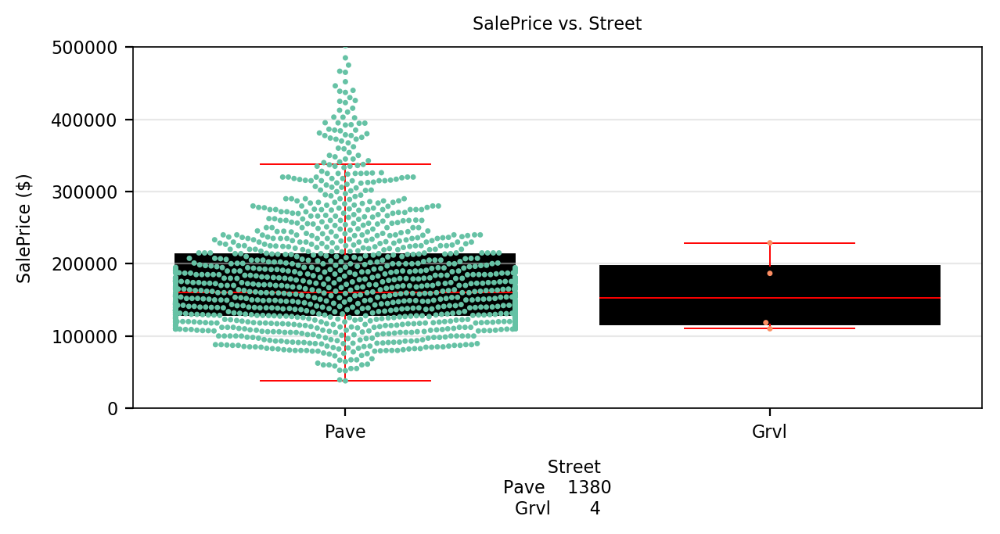

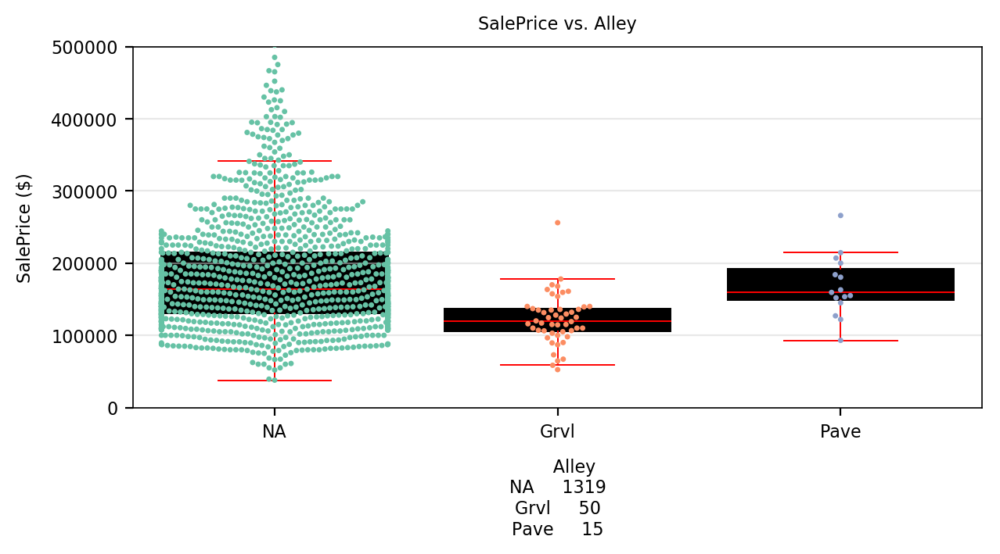

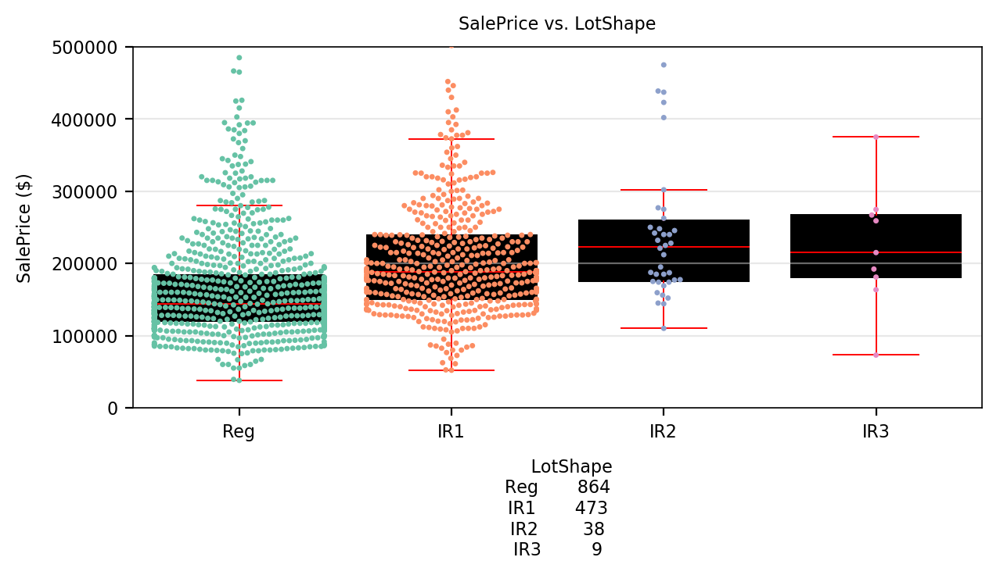

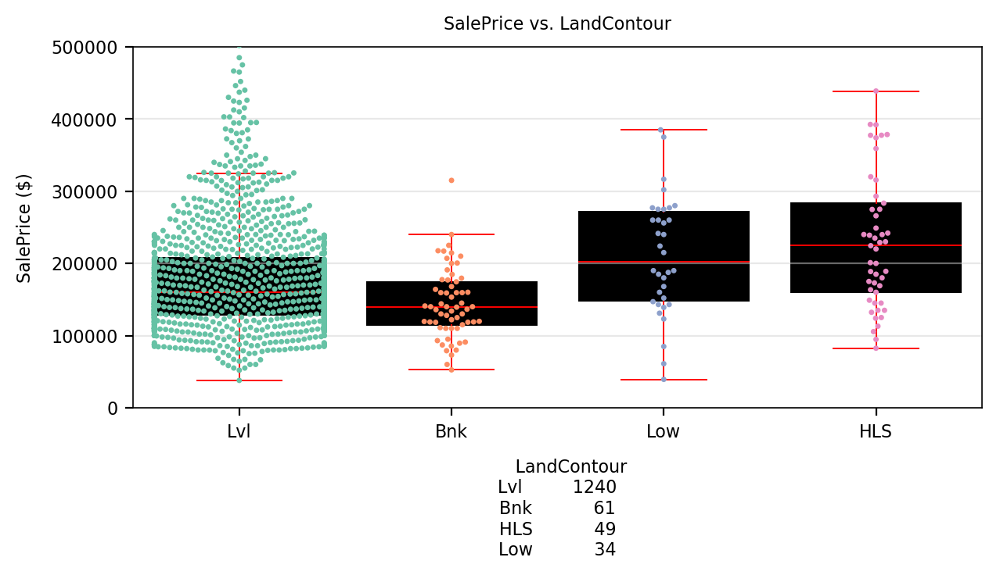

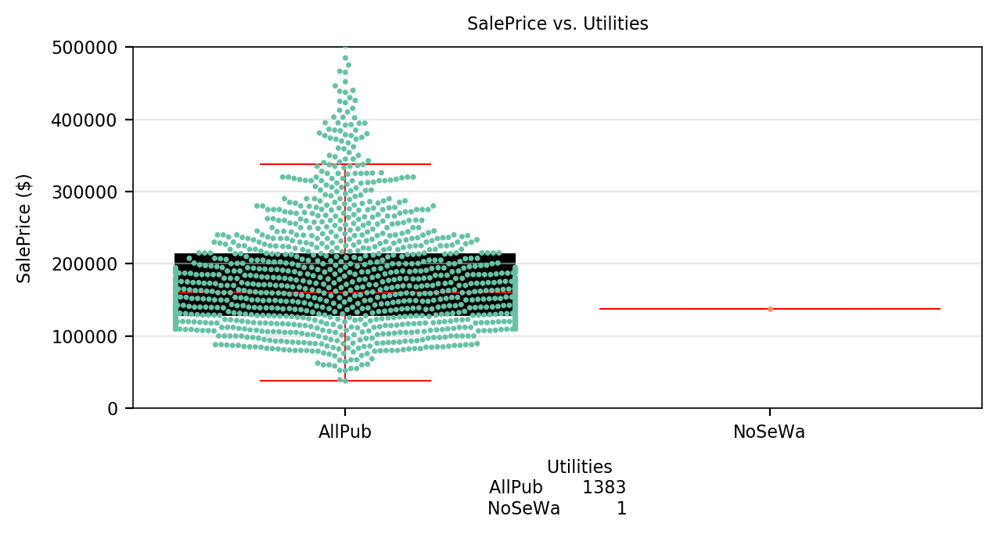

...

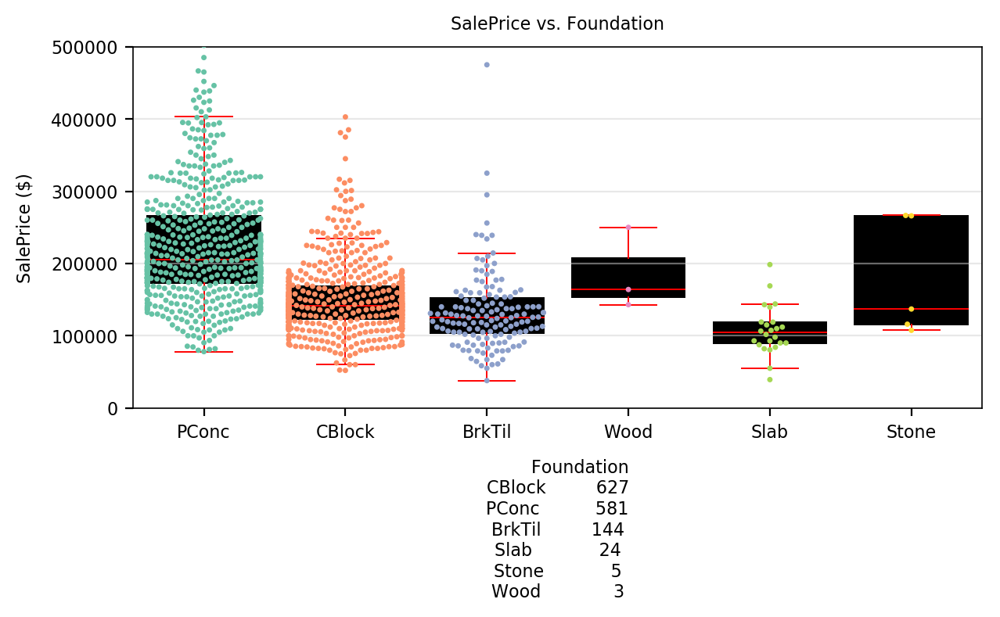

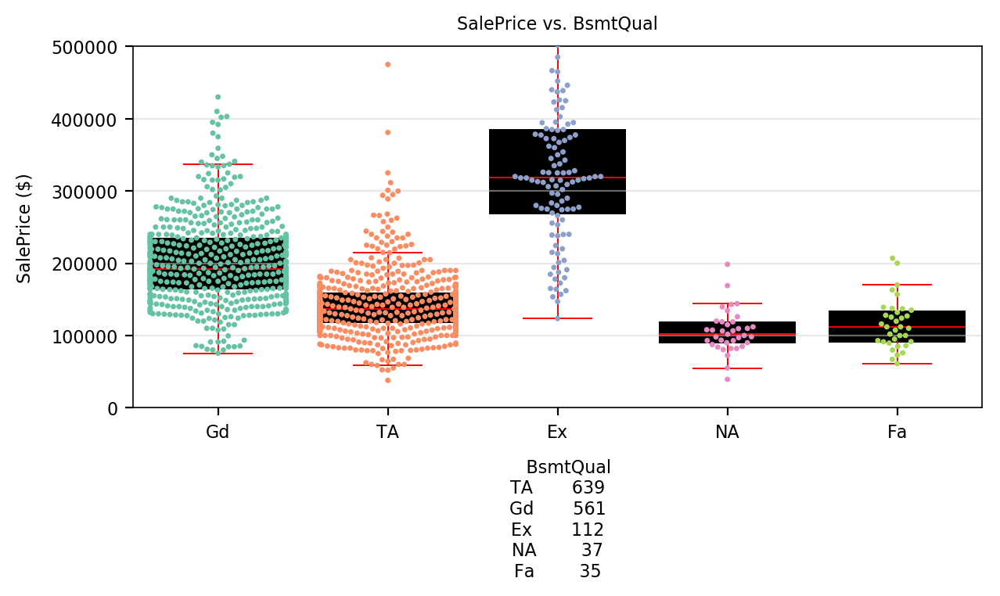

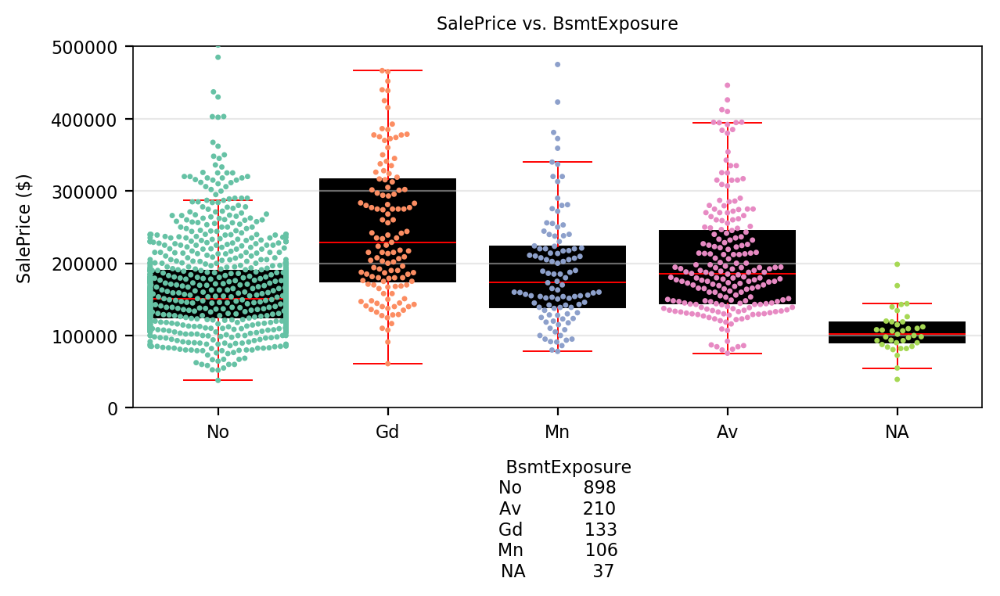

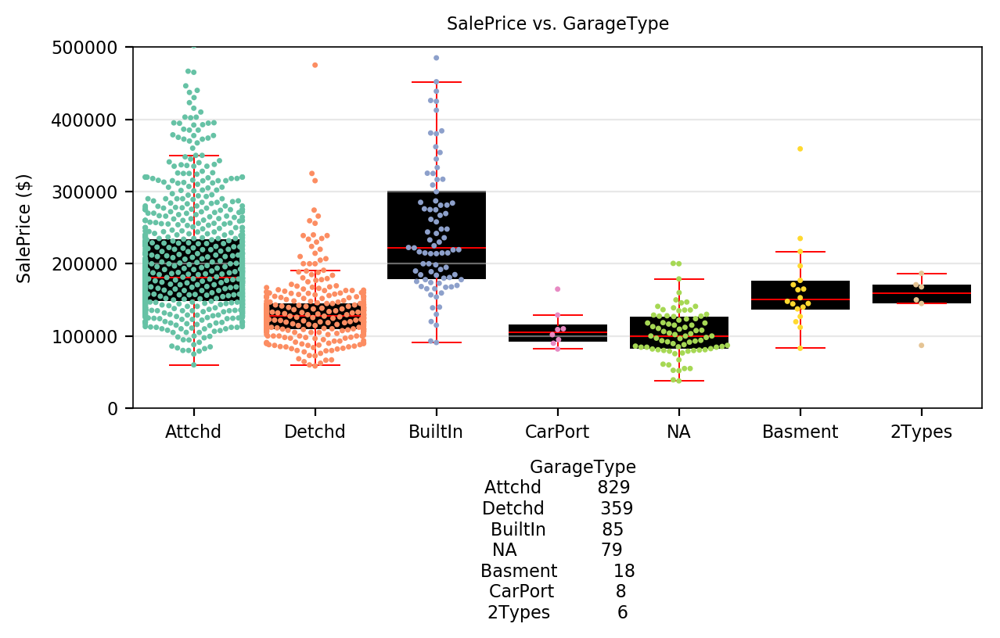

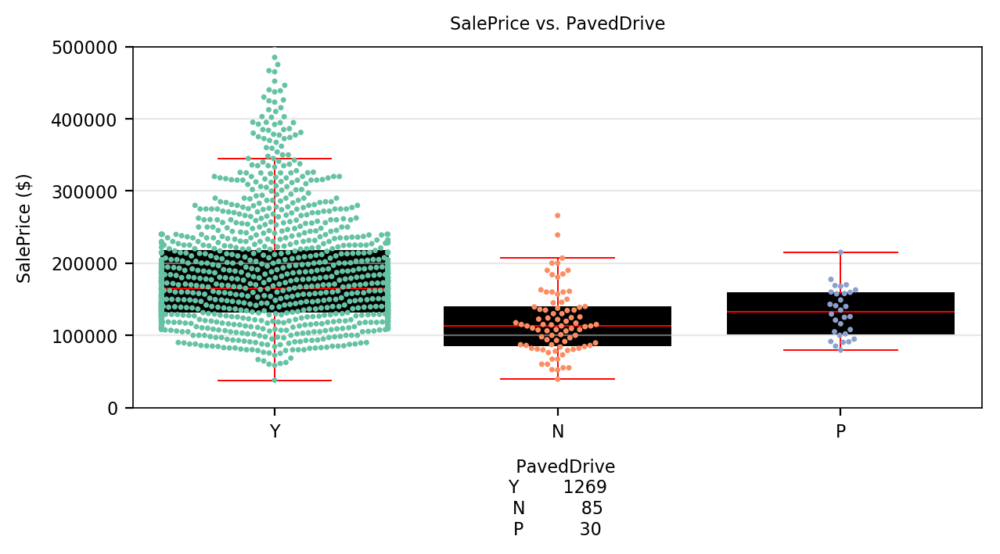

In [734]:
# Call plot_price_boxplot function for each categorical variable in the cat_cols_to_eda list
for cat_var in cat_cols_to_eda:
    plot_price_boxplot(cat_var, house_df)

Reviewing the boxplots and swarmplots above, I'm looking for categorical variables that demonstrate both:<br>
1) a variation in sale price across their different values, and <br>
2) have a 'reasonable' spread of datapoints across their different values

I feel that the following fields satisfy these criteria:
- LotShape
- Condition1
- BldgType
- HouseStyle  
- Foundation
- BsmtQual
- BsmtExposure
- GarageType


Let's compare the categorical features identified above with the numeric predictors already selected.

In [736]:
# Display list of numeric predictors
predictors_num

['YearRemodAdd',
 'TotalBsmtSF',
 'GrLivArea',
 'FullBath',
 'GarageCars',
 'Fireplaces',
 'WoodDeckSF',
 'OpenPorchSF']

I'm satisfied that these represent quite different characteristics of these homes.  

In [738]:
# Add these variables to our list of categorical predictors
predictors_cat.extend(['LotShape', 'Condition1', 'BldgType', 'HouseStyle', 
                       'Foundation', 'BsmtQual','BsmtExposure', 'GarageType'])

### Train and evaluate a model to predict sales price

#### Define predictor and target

I have both numeric and categorical predictors, which I've kept separate up until now.  I'll now combine these into a single list.

In [739]:
# Print numeric and categorical variables
print(f'Proposed numeric predictors: \n{predictors_num}\n')   
print(f'Proposed categorical predictors: \n{predictors_cat}\n')   

# Define list of all proposed predictors and print list
predictors_all = predictors_num + predictors_cat
print(f'All proposed predictors: \n{predictors_all}\n')

Proposed numeric predictors: 
['YearRemodAdd', 'TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageCars', 'Fireplaces', 'WoodDeckSF', 'OpenPorchSF']

Proposed categorical predictors: 
['Neighborhood', 'LotShape', 'Condition1', 'BldgType', 'HouseStyle', 'Foundation', 'BsmtQual', 'BsmtExposure', 'GarageType']

All proposed predictors: 
['YearRemodAdd', 'TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageCars', 'Fireplaces', 'WoodDeckSF', 'OpenPorchSF', 'Neighborhood', 'LotShape', 'Condition1', 'BldgType', 'HouseStyle', 'Foundation', 'BsmtQual', 'BsmtExposure', 'GarageType']



Model is to be trained on pre-2010 data and tested on 2010 data. 

In [740]:
 # Print number of rows expected in train-test split
print(f"We expect {(house_df['YrSold'] < 2010).sum()} homes in the training set.")
print(f"We expect {(house_df['YrSold'] == 2010).sum()} homes in the testing set.")


We expect 1220 homes in the training set.
We expect 164 homes in the testing set.


In [743]:
# Define predictor DF and target series
X = house_df[predictors_all]
y = house_df['SalePrice']

In [746]:
# Display predictor information
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1384 entries, 0 to 1383
Data columns (total 17 columns):
YearRemodAdd    1384 non-null int64
TotalBsmtSF     1384 non-null int64
GrLivArea       1384 non-null int64
FullBath        1384 non-null int64
GarageCars      1384 non-null int64
Fireplaces      1384 non-null int64
WoodDeckSF      1384 non-null int64
OpenPorchSF     1384 non-null int64
Neighborhood    1384 non-null object
LotShape        1384 non-null object
Condition1      1384 non-null object
BldgType        1384 non-null object
HouseStyle      1384 non-null object
Foundation      1384 non-null object
BsmtQual        1384 non-null object
BsmtExposure    1384 non-null object
GarageType      1384 non-null object
dtypes: int64(8), object(9)
memory usage: 183.9+ KB


The predictor data is aligned with expectations.

In [747]:
# Dumify categorical variables in predictor data, dropping the first value for each field
X_dumified = pd.get_dummies(X, drop_first=True)

# Display head of X_dumified df
X_dumified.head()

,YearRemodAdd,TotalBsmtSF,GrLivArea,FullBath,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,LotShape_IR2,LotShape_IR3,LotShape_Reg,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA
0,2003,856,1710,2,2,0,0,61,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0
1,1976,1262,1262,2,2,1,298,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0
2,2002,920,1786,2,2,1,0,42,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0
3,1970,756,1717,1,3,1,0,35,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
4,2000,1145,2198,2,3,1,192,84,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0


In [749]:
# Define train and test data sets
X_train = X_dumified[house_df['YrSold'] < 2010]  
X_test = X_dumified[house_df['YrSold'] == 2010]

y_train = y[house_df['YrSold'] < 2010]
y_test = y[house_df['YrSold'] == 2010]

In [750]:
# Print type and shape of feature and target train and test data to ensure aligned with expectations
print(type(X_train), type(X_test), type(y_train), type(y_test))
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

<class 'pandas.core.frame.DataFrame'> <class 'pandas.core.frame.DataFrame'> <class 'pandas.core.series.Series'> <class 'pandas.core.series.Series'>
(1220, 73) (164, 73) (1220,) (164,)


Data types and shapes are as expected.

In [751]:
# Standardise train and test predictor data, based on mean and std of training data only

ss = StandardScaler()

X_train_ss = ss.fit_transform(X_train)
X_test_ss = ss.transform(X_test)

Review standardised train and test predictor data to ensure no surprises.

In [752]:
# Display summary statistics for standardised predictor training data
pd.DataFrame(X_train_ss, columns=X_dumified.columns).describe()

,YearRemodAdd,TotalBsmtSF,GrLivArea,FullBath,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,LotShape_IR2,LotShape_IR3,LotShape_Reg,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA
count,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03
mean,1.486607e-15,1.380954e-16,1.960636e-16,-1.425090e-16,-8.262971e-17,1.540662e-16,2.912060e-16,-2.165845e-17,1.685810e-16,-1.067225e-16,-1.110678e-16,6.952999e-16,-1.826408e-16,1.233076e-16,-1.892839e-16,3.963132e-17,-3.829359e-16,-1.707423e-16,-1.219425e-16,1.839148e-16,9.668951e-17,8.061402e-16,2.533948e-16,2.145369e-16,2.366049e-16,7.247390e-16,1.508356e-16,1.545667e-16,7.227370e-16,-1.486971e-16,1.901484e-16,1.448978e-16,5.104751e-16,1.451480e-16,1.745416e-16,1.843243e-16,5.037864e-16,6.954819e-17,-1.779314e-16,-2.113746e-16,4.923202e-16,-4.866895e-17,-2.245472e-16,-3.400286e-16,3.889421e-16,-4.080070e-16,1.498801e-16,8.319165e-16,1.471501e-16,2.643605e-16,-1.386186e-16,2.409730e-16,-1.553857e-16,-2.504827e-16,-1.274026e-17,-1.792737e-17,2.871110e-17,1.505057e-16,1.758611e-16,8.476826e-17,-5.469213e-17,9.773603e-17,3.714697e-16,1.629844e-16,-2.269587e-16,9.773603e-17,2.531673e-16,9.737202e-17,2.232959e-16,-1.151174e-16,-1.936065e-17,2.493452e-17,2.611754e-17
std,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00

Mean and std of X_train_ss columns is ~0 and ~1 respectively.  Values looks reasonable.

In [753]:
# Display summary statistics for standardised predictor test data
pd.DataFrame(X_test_ss, columns=X_dumified.columns).describe()

,YearRemodAdd,TotalBsmtSF,GrLivArea,FullBath,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,LotShape_IR2,LotShape_IR3,LotShape_Reg,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA
count,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,1.640000e+02,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,1.640000e+02,164.000000,164.000000,1.640000e+02,164.000000,1.640000e+02,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,1.640000e+02,164.000000,1.640000e+02,1.640000e+02,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000
mean,0.030568,0.007768,-0.063220,-0.061904,-0.114829,-0.039067,0.099942,-0.167720,-4.052204e-02,-0.056239,-0.161066,0.033975,-0.104605,-0.108283,-0.019551,-0.098029,-0.015522,0.064008,-0.066294,0.120395,0.085495,-0.050464,0.090002,-0.033667,0.018536,0.001953,0.235064,0.218201,-1.323427e-01,0.110994,0.021196,-9.538568e-02,0.021196,-8.620832e-02,0.094265,-0.007270,-0.055420,0.222178,-0.014838,0.145398,-0.097750,0.184424,0.049310,0.070556,0.030760,-0.045227,0.072498,-1.077433e-01,0.118673,-8.124445e-02,-9.090909e-02,-0.029412,0.071016,-0.022830,0.162941,-0.081824,0.008300,0.049310,0.110200,-0.049662,-0.006718,0.026645,0.059424,-0.109756,-0.014544,0.026645,0.037475,0.081225,0.121258,-0.002081,0.004764,-0.133635,0.049410
std,0.988697,0.982703,0.979975,0.992837,0.956840,1.074412,1.123557,0.728592,1.461631e-16,0.708596,0.526073,1.114199,0.858281,0.691406,0.969888,0.793972,0.948776,1.262060,0.820935,1.104306,1.457596,0.896330,1.231859,0.935382,1.031203,1.010132,1.398678,1.422628,1.670435e-16,1.358070,1.063030,3.201667e-16,1.063030,1.252826e-16,0.975077,0.988938,1.057916,2.103994,0.939203,1.665411,0.562298,2.728576,1.365970,1.217233,1.075766,0.854173,1.119375,1.670435e-16,0.995581,2.088044e-16,3.340870e-16,0.988691,1.196676,0.952853,1.008340,0.987056,1.033471,1.365970,1.930186,0.841074,1.001746,1.079057,1.006288,0.836383,0.979543,1.079057,0.990744,0.983931,1.452769,0.999243,1.033852,0.919818,1.093718
min,-1.653692,-2.499429,-1.696095,-2.812790,-2.325358,-0.981262,-0.760079,-0.692168,-4.052204e-02,-0.111571,-0.219340,-0.141658,-0.355669,-0.202375,-0.278816,-0.252278,-0.144639,-0.107743,-0.195698,-0.432169,-0.075966,-0.239149,-0.169316,-0.244843,-0.295540,-0.135514,-0.223414,-0.197945,-1.323427e-01,-0.129099,-0.166737,-9.538568e-02,-0.166737,-8.620832e-02,-1.274228,-0.244843,-2.485251,-0.064150,-0.118875,-0.081244,-0.141658,-0.028642,-0.057354,-0.144639,-0.195698,-0.161469,-0.268433,-1.077433e-01,-1.003284,-8.12

Mean and standard deviation here aren't 0 and 1 respectively, since this data has been standardised with mean and std of the training data.

In [754]:
# Display summary statistics of target training data
y_train.describe()

count      1220.000000
mean     180464.039344
std       79790.721924
min       37900.000000
25%      129500.000000
50%      161250.000000
75%      213000.000000
max      755000.000000
Name: SalePrice, dtype: float64

In [755]:
# Display summary statistics of target test data
y_test.describe()

count       164.000000
mean     177820.878049
std       81196.031764
min       55000.000000
25%      128150.000000
50%      154650.000000
75%      210500.000000
max      611657.000000
Name: SalePrice, dtype: float64

My target and standardised predictor data looks OK.  I will now fit a model to it.

#### Train and evaluate Linear Regression Model

Start by fitting a linear regression on training data (pre-2010 sales) without 
any cross-validation or regularization, and evaluate R2 score on both train and test data

In [830]:
# Fit Linear Regression model on training data
lnr = LinearRegression()
lnr.fit(X_train_ss, y_train)
print(f'R2 score on training data: {round(lnr.score(X_train_ss, y_train),3)}')
print(f'R2 score on test data: {round(lnr.score(X_test_ss, y_test),3)}')

R2 score on training data: 0.866
R2 score on test data: 0.867


The model has an R2 of 0.868 on the test data, which means that the predictor variables I've 
chosen explain 86.8% of the variance in the target test data not
explained by the baseline prediction (i.e. mean of the Sale Price).  

The model is doing a good job of predicting the sales price and has generalised 
well to the test data.


In [831]:
# Print baseline prediction
print(f'Baseline prediction: ${round(np.mean(y_test))}')

Baseline prediction: $177821


In [832]:
# Look at model intercept and range of coefficients
print(f'Intercept: {lnr.intercept_}')
print(f'\nRange of Coefficients: {[min(lnr.coef_), max(lnr.coef_)]}')

Intercept: 180464.03934426227

Range of Coefficients: [-9.720948123189678e+16, 9.720948123189072e+16]


With standardised predictors, the intercept can be interpreted as the estimate when all predictors are at their mean value. 

Coefficients are units of standard deviations of the` predictors. 

Standardising the predictors also allows for direct comparison (and regularisation) of the magnitude of impact between different predictors. 

##### Model evaluation with root mean squared error

In [833]:
# Calculate RMSE
predictions = lnr.predict(X_test_ss)

print(f'Root Mean Square Error of model on test data is: \
${int(mean_squared_error(y_test, predictions)**0.5)}')

print(f'Root Mean Square Error of model on train data is: \
${int(mean_squared_error(y_train, lnr.predict(X_train_ss))**0.5)}')

Root Mean Square Error of model on test data is: $29506
Root Mean Square Error of model on train data is: $29239


The RMSE is quite good, and similar for the training and test data.  The RMSE is slightly less for the test data than the train data, which is aligned with the train and test R2 scores above.

In [834]:
# Print RMSE for baseline prediction, for comparion
baseline = np.repeat(np.mean(y_test), len(y_test))

print(f'Root Mean Square Error of baseline model is: \
${int(mean_squared_error(y_test, baseline)**0.5)}.')


Root Mean Square Error of baseline model is: $80948.


As indicated by the R2 score, the model has a significantly lower RMSE than the baseline prediction.

Note, the ratio of the difference in MSE for the baseline and predictions, with the MSE for  
the baseline is the same as the R2 score calculated above.

In [835]:
# Print manual calculation of R2 score
round((mean_squared_error(y_test, baseline) - mean_squared_error(y_test, predictions)) 
      / mean_squared_error(y_test, baseline), 3)

0.867

This manual calcualation of the R2 score for the test data is aligned with the calculation above.

In [836]:
# Define a function to plot predictions vs actuals

def plot_y_yhat(y, yhat):
    '''This function accepts 2 series and plots a scatter plot of y vs yhat.
    The function also plots an x=y line to demonstrate the 'perfect model', 
    where y = yhat'''

    plt.figure(figsize=(5,5))

    plt.scatter(y, yhat, color='mediumorchid', s=4, label='Predicted vs. Actual', alpha=0.7 )

    # Plot 'perfect model' (x=y) line on plot
    max_val = np.max(y)
    plt.plot([0, max_val*1.05], [0, max_val*1.05], color='navy',
            linewidth=2.0, alpha=0.7, label='Perfect model', )
    
    # Add grid to plot
    plt.grid(color='lightgrey', linewidth=0.7, linestyle='--')
    
    plt.xlabel('Actual Sale Price ($)')
    plt.xlim(0,max_val*1.05)

    plt.ylabel('Predicted Sale Price ($)')
    plt.ylim(0,max_val*1.05)
    
    plt.title('Plot of predicted values vs. actual values')
    plt.legend() 

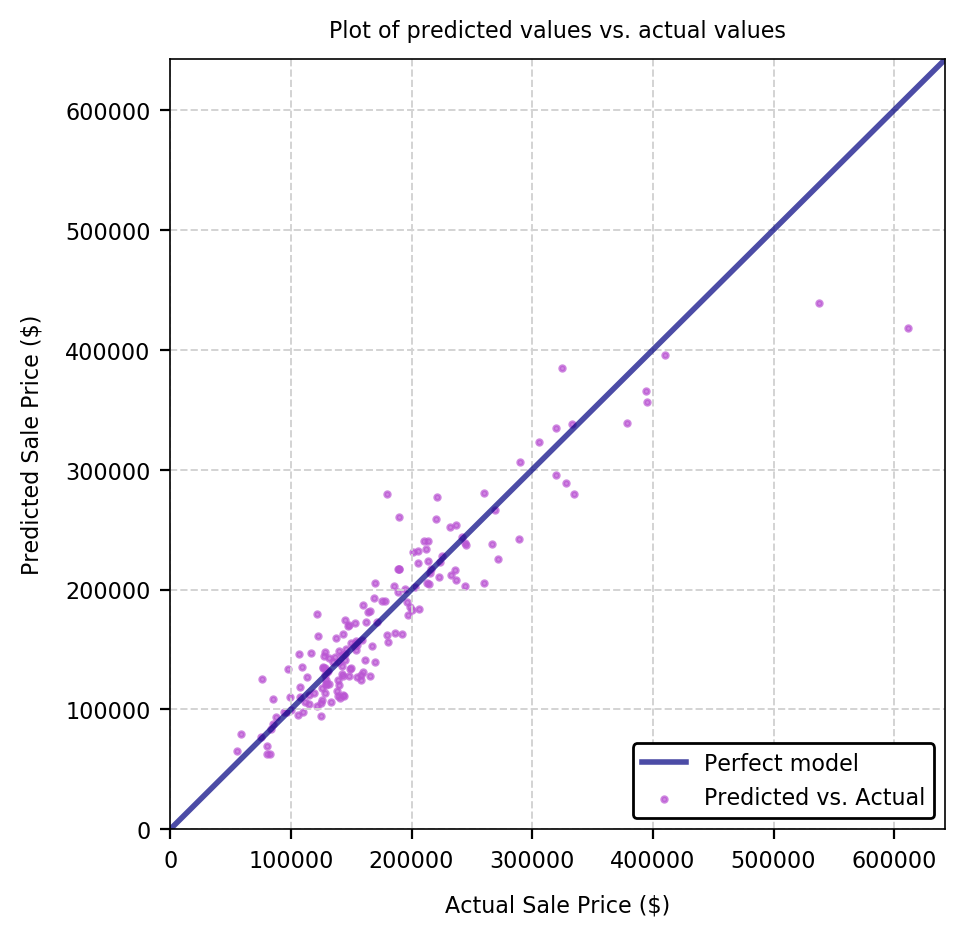

In [837]:
# Call function to plot model predictions vs actual test values
plot_y_yhat(y_test, lnr.predict(X_test_ss))

Model performs well.  There are a couple of sales with high values that aren't represented well by the model and have large residuals.  

In [838]:
# Display descriptive statistics for model predictions
pd.DataFrame(lnr.predict(X_test_ss), columns=['Predicted Sales Price']).describe()

,Predicted Sales Price
count,164.000000
mean,176106.006489
std,73132.806848
min,62612.541321
25%,125493.665835
50%,155981.592131
75%,216227.904363
max,439399.703766


In [842]:
# Display 10 largest model residuals, where prediction underestimated actual sale price 
df = pd.DataFrame({'Actual':y_test,'Prediction':lnr.predict(X_test_ss)})
df['Residual'] = df['Actual'] - df['Prediction']
df.sort_values('Residual', inplace=True, ascending=False)
df.head(10)

,Actual,Prediction,Residual
847,611657,418310.279898,193346.720102
725,538000,439399.703766,98600.296234
1241,335000,279770.279898,55229.720102
1203,260000,205378.279898,54621.720102
510,272000,225300.279898,46699.720102
476,289000,242404.904363,46595.095637
886,244400,202706.279898,41693.720102
1200,378500,338626.279898,39873.720102
930,395192,356082.279898,39109.720102
1006,328000,289148.279898,38851.720102


In [843]:
# Display 10 largest negative residuals, where prediction overestimated actual sale price 
df.tail(10)

,Actual,Prediction,Residual
621,97500,133402.904363,-35902.904363
1342,122500,161070.541321,-38570.541321
153,220000,259026.279898,-39026.279898
728,107000,146367.916855,-39367.916855
238,76500,125706.321951,-49206.321951
647,221000,277490.904363,-56490.904363
529,121500,179302.541321,-57802.541321
1043,325000,384488.279898,-59488.279898
1252,190000,260130.904363,-70130.904363
63,180000,280042.279898,-100042.279898


##### Cross validation and Regularisation grid search

I'll now see if I can improve on the model performance with regularisation.

###### Ridge

In [853]:
# Gridsearch using RidgeCV
ridge_alphas = np.logspace(-3,5,200)
ridge = RidgeCV(alphas=ridge_alphas, cv=5)
ridge.fit(X_train_ss, y_train)

print(f'Optimal Ridge R2 score on training data: {round(ridge.score(X_train_ss, y_train),3)}')
print(f'Best alpha: {round(ridge.alpha_,3)}')

Optimal Ridge R2 score on training data: 0.865
Best alpha: 24.094


There has been no improvement in the model on the training data with the GridSearch on Ridge regularisation hyperparamaters.

In [855]:
# Using the best alpha, cross validate the training data and print the mean R2 score
optimum_ridge = Ridge(alpha = ridge.alpha_)
print(f'Mean R2 score for optimal Ridge cross validation on training data:', 
      round(np.mean(cross_val_score(optimum_ridge, X_train_ss, y_train, cv=5)),3))

Mean R2 score for optimal Ridge cross validation on training data: 0.838


In [857]:
# Fit optimum ridge on training data, and score it on the test data
optimum_ridge.fit(X_train_ss, y_train)
print(f'R2 score of optimum Ridge on test data: {round(optimum_ridge.score(X_test_ss,y_test),3)}')

R2 score of optimum Ridge on test data: 0.865


Ridge regularisation has yielded no improvement on the model performance.

###### Lasso

Perhaps the model has too many predictors.  Let's try Lasso regularisation.

In [871]:
# Perform a lasso regularisation gridserach
lasso = LassoCV(alphas=np.logspace(-4,3,500), cv=10, verbose=1, max_iter=10000)
lasso.fit(X_train_ss, y_train)

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

LassoCV(alphas=array([1.00000e-04, 1.03283e-04, ..., 9.68215e+02, 1.00000e+03]),
    copy_X=True, cv=10, eps=0.001, fit_intercept=True, max_iter=10000,
    n_alphas=100, n_jobs=1, normalize=False, positive=False,
    precompute='auto', random_state=None, selection='cyclic', tol=0.0001,
    verbose=1)

In [872]:
# Display optimum alpha value
lasso.alpha_

355.71502068213897

This alpha value is well within the range selected for the gridsearch.

In [873]:
# Fit optimum lasso model to training data and print R2 score for test data
optimum_lasso = Lasso(alpha=lasso.alpha_)
optimum_lasso.fit(X_train_ss, y_train)

print(f'R2 score for optimum Lasso model on test data: {round(optimum_lasso.score(X_test_ss, y_test),3)}')

R2 score for optimum Lasso model on test data: 0.865


The optimum Lasso performs very similar to the Ridge regularisation, which I'm surprised about.

I'll now review the coefficients for the optimum Lasso model.

In [884]:
# Define dataframe with predictor coefficients for optimum Lasso model
lasso_coeffs = pd.DataFrame({'Feature': X_dumified.columns,
                             'Coef': optimum_lasso.coef_,
                             'Abs_Coef': np.abs(optimum_lasso.coef_)})

lasso_coeffs.sort_values('Abs_Coef', inplace=True, ascending=False)

In [885]:
# Display 10 most important/largest coefficients
lasso_coeffs.head(10)

,Feature,Coef,Abs_Coef
2,GrLivArea,29218.633506,29218.633506
62,BsmtQual_TA,-20464.308374,20464.308374
60,BsmtQual_Gd,-18635.954140,18635.954140
1,TotalBsmtSF,14188.018102,14188.018102
23,Neighborhood_NridgHt,11090.744787,11090.744787
22,Neighborhood_NoRidge,9857.799491,9857.799491
0,YearRemodAdd,9113.041256,9113.041256
29,Neighborhood_StoneBr,8041.824726,8041.824726
4,GarageCars,7542.320145,7542.320145
59,BsmtQual_Fa,-6999.641064,6999.641064


The 2 numerical predictors with the highest correlation with sales price (GrLivArea and GarageCars) also turn out to be the 2 most significant numeric predictors from a coefficient perceptive.

In [886]:
# Display 10 least important/smallest coefficients
lasso_coeffs.tail(10)

,Feature,Coef,Abs_Coef
41,Condition1_RRNe,0.0,0.0
51,HouseStyle_2Story,0.0,0.0
8,Neighborhood_Blueste,0.0,0.0
42,Condition1_RRNn,0.0,0.0
10,Neighborhood_BrkSide,0.0,0.0
15,Neighborhood_Gilbert,-0.0,0.0
58,Foundation_Wood,0.0,0.0
48,HouseStyle_1Story,0.0,0.0
50,HouseStyle_2.5Unf,-0.0,0.0
72,GarageType_NA,0.0,0.0


As expected, the Lasso has zeroed out some predictor coefficients.

In [887]:
print(f'Percent of predictor coefficients zeroed out by Lasso regularisation: \
{round((np.sum(optimum_lasso.coef_ == 0)/float(X_dumified.shape[1])) * 100,2)}%.')

Percent of predictor coefficients zeroed out by Lasso regularisation: 21.92%.


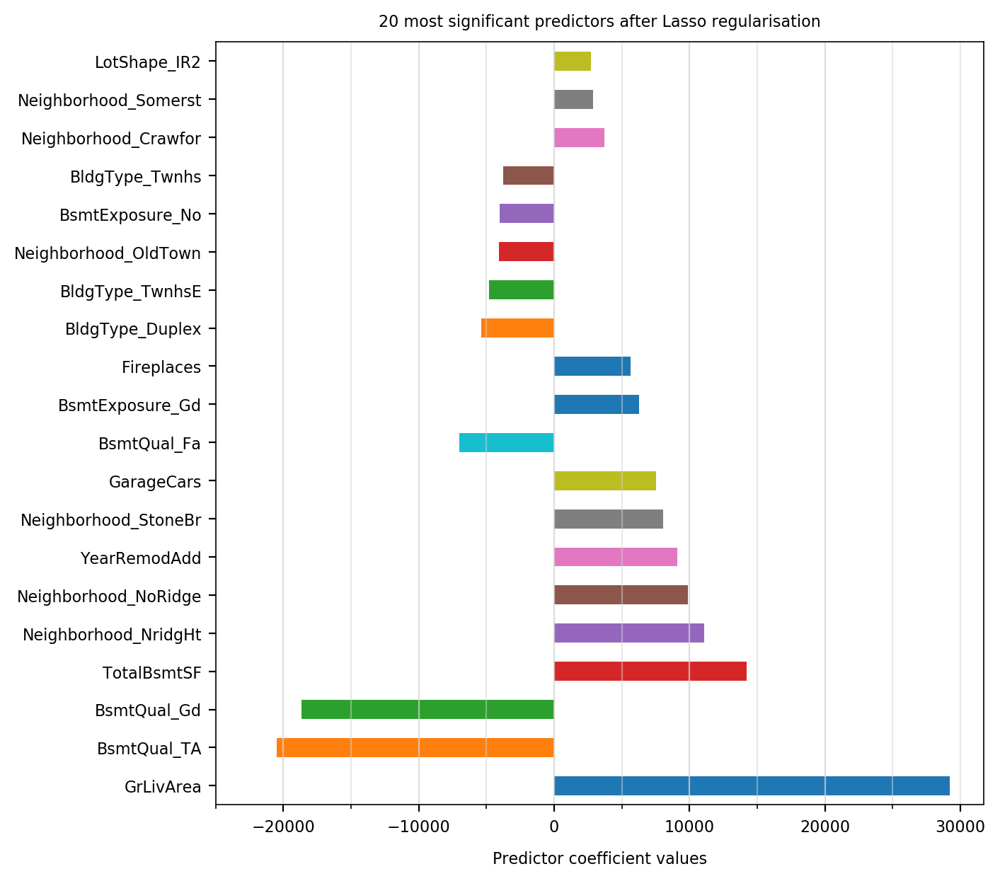

In [900]:
# Plot 20 largest coefficients
fig, ax = plt.subplots(figsize=(7,7))
title = '20 most significant predictors after Lasso regularisation'
lasso_coeffs.Coef[:20].plot(kind='barh', ax=ax)
ax.set_yticklabels(lasso_coeffs.Feature[:20].values)
ax.set_xlabel('Predictor coefficient values')
ax.set_title(title)

# Add a vertical grid to the plot
ax.xaxis.grid(True, linestyle='-', which='both', color='lightgrey', alpha=0.5)
ax.set_xticks(range(-25000, 30000, 5000), minor=True);


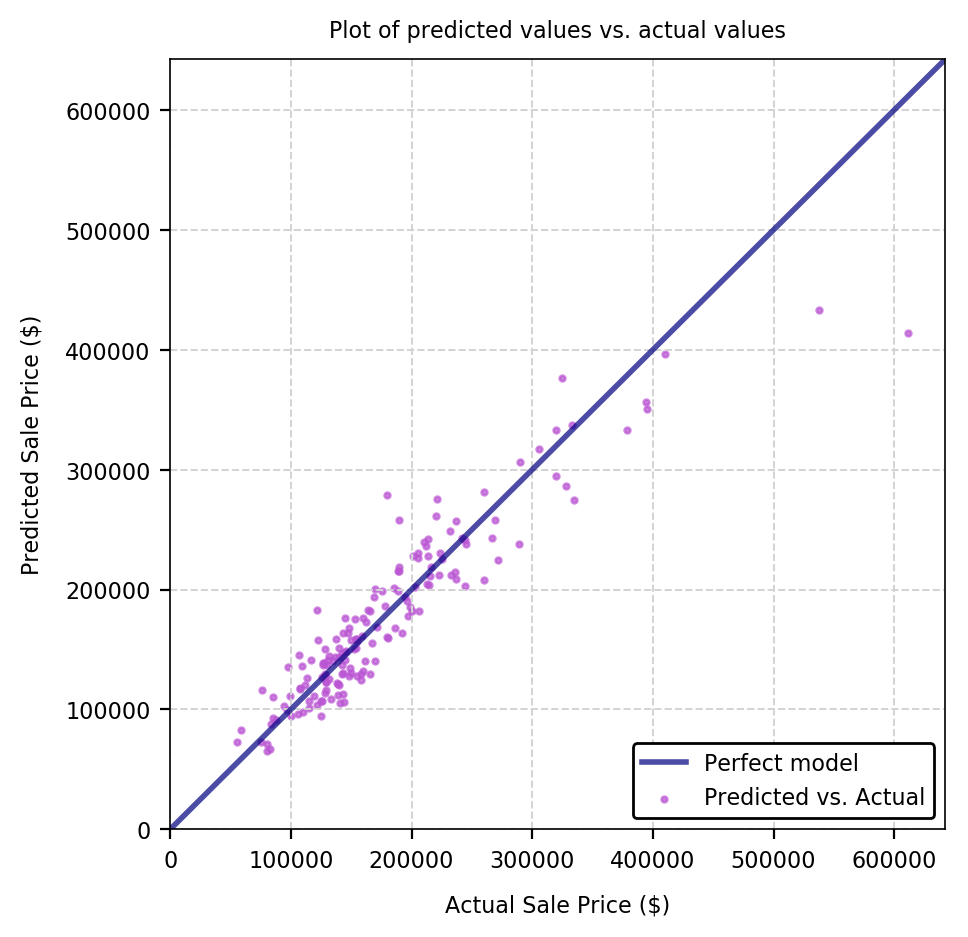

In [901]:
# Plot predictions for test data from optimum lasso model vs actual sale prices
predictions = optimum_lasso.predict(X_test_ss)
plot_y_yhat(y_test, predictions)

The model performs well on the test set, apart from 2 data points at the upper extreme of the sales price range.

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## Determine any value of *changeable* property characteristics unexplained by the *fixed* ones.

---

Now that you have a model that estimates the price of a house based on its static characteristics, we can move forward with part 2 and 3 of the plan: what are the costs/benefits of quality, condition, and renovations?

There are two specific requirements for these estimates:
1. The estimates of effects must be in terms of dollars added or subtracted from the house value. 
2. The effects must be on the variance in price remaining from the first model.

The residuals from the first model (training and testing) represent the variance in price unexplained by the fixed characteristics. Of that variance in price remaining, how much of it can be explained by the easy-to-change aspects of the property?

---

**Your goals:**
1. Evaluate the effect in dollars of the renovatable features. 
- How would your company use this second model and its coefficients to determine whether they should buy a property or not? Explain how the company can use the two models you have built to determine if they can make money. 
- Investigate how much of the variance in price remaining is explained by these features.
- Do you trust your model? Should it be used to evaluate which properties to buy and fix up?

### EDA

#### Model predicted prices and review residuals

In [140]:
# Define copy of house data
house_reno = house.copy()

In [141]:
# To the reno_df, add the predicted price as modeled by the optimimum lasso regularisation above in 1.6.2.3

# Re-standardise all data in dummified predictors matrix based on mean and std of X_train data
# This standardised predictor data will then be used as the basis for predicting all sales prices using 
# the optimum Lasso model in 1.6.2.3
ss = StandardScaler()
ss.fit(X_train)
X_ss = ss.transform(X_dumified)

# Insert predicted prices and based on fixed features and residuals
house_reno['Predicted SalePrice'] = optimum_lasso.predict(X_ss)
house_reno['Residuals'] = house_reno['SalePrice'] - house_reno['Predicted SalePrice']

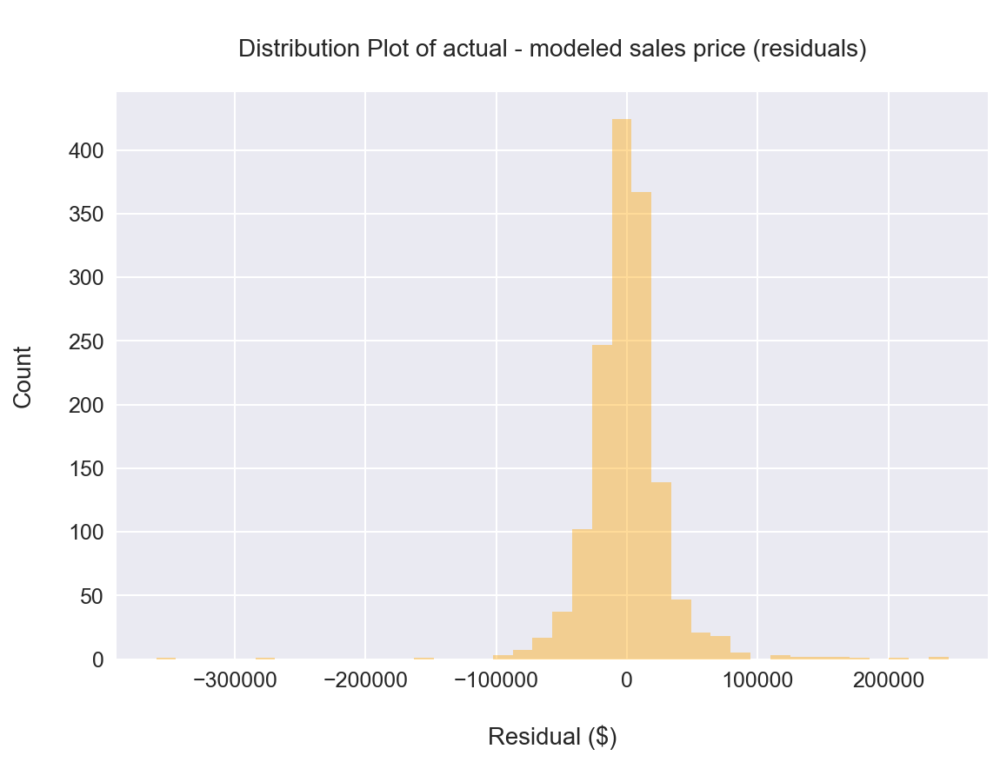

In [142]:
# Plot distribution plot of ALL Sales Price residuals
sns.set(font_scale=1.25)
fig = plt.figure(figsize=(8,6))
ax = fig.gca()

ax = sns.distplot(house_reno['Residuals'], kde=False, bins=40, color='orange')

ax.set_title('\nDistribution Plot of actual - modeled sales price (residuals)\n', fontsize=14)
ax.set_xlabel('\nResidual ($)')
ax.set_ylabel('Count\n') ;
 

In [143]:
# Residuals appear normally distributed, as expected.

# Test if the sum of the residuals for the train data is 0
print(f"Sum of residuals for training data is: \
${house_reno.loc[house_reno['YrSold']<2010,'Residuals'].sum()}.")


Sum of residuals for training data is: $-2.4156179279088974e-08.


Sum of residuals for train data is 0, as expected.  

I wouldn't expect the sum of residuals for my test data, or the sum of residuals 
for all predicted prices to be 0, as the model was not trained on all this data 
and the model is an imperfect fit for the test data.

In [144]:
print(f"Sum of residuals for test data is: \
${round(house_reno.loc[house_reno['YrSold']==2010,'Residuals'].sum(),2)}.")

print(f"Mean of residuals for test data is: \
${round(house_reno.loc[house_reno['YrSold']==2010,'Residuals'].mean(),2)}.")

Sum of residuals for test data is: $238297.85.
Mean of residuals for test data is: $1385.45.


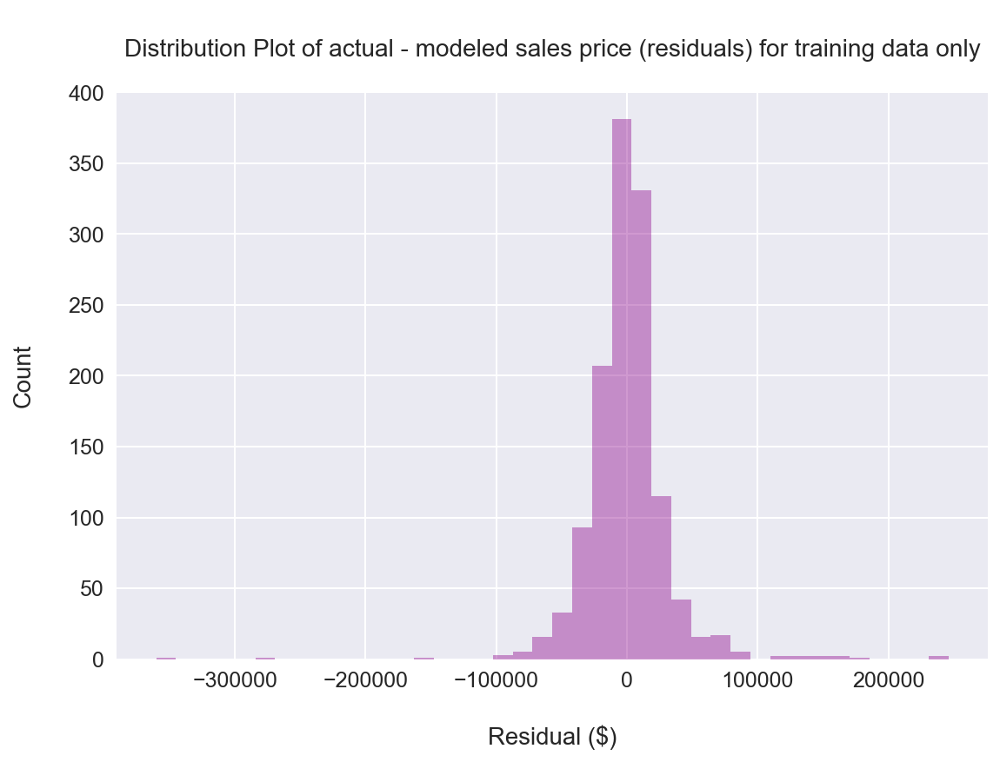

In [145]:
# Plot distribution plot of Sales Price residuals for training data only
sns.set(font_scale=1.25)
fig = plt.figure(figsize=(8,6))
ax = fig.gca()

ax = sns.distplot(house_reno.loc[house_reno['YrSold']<2010,'Residuals'], 
                  kde=False, bins=40, color='darkmagenta')

ax.set_title('\nDistribution Plot of actual - modeled sales price (residuals) \
for training data only\n', fontsize=14)
ax.set_xlabel('\nResidual ($)')
ax.set_ylabel('Count\n') ;

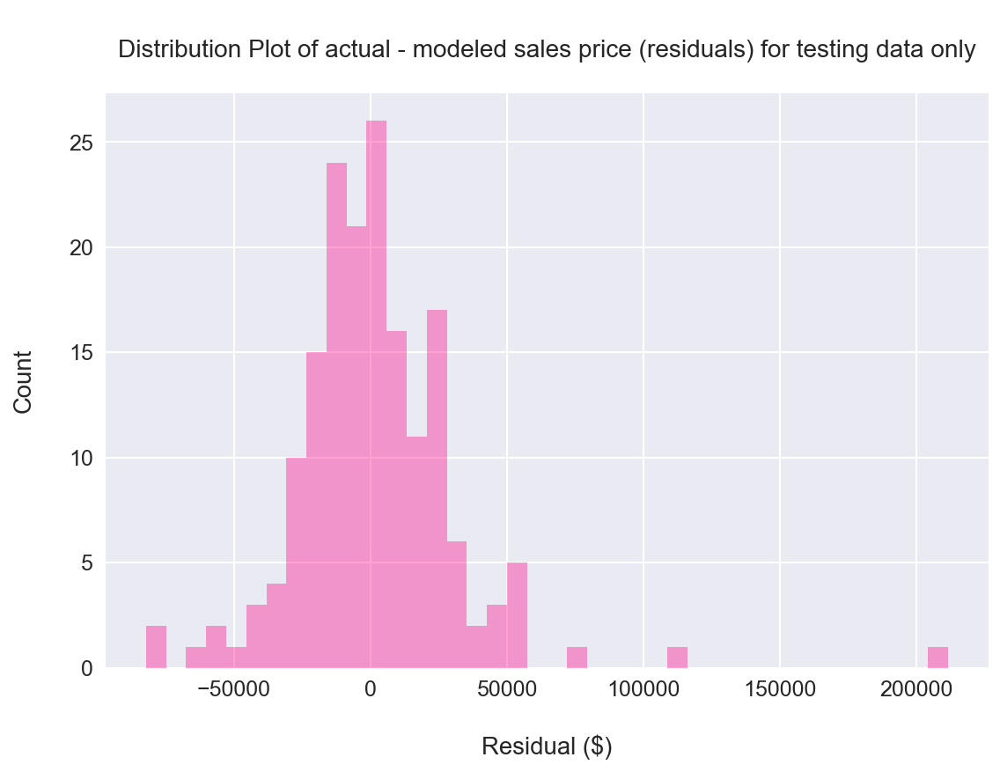

In [146]:
# Plot distribution plot of Sales Price residuals for testing data only
sns.set(font_scale=1.25)
fig = plt.figure(figsize=(8,6))
ax = fig.gca()

ax = sns.distplot(house_reno.loc[house_reno['YrSold']==2010,'Residuals'], 
                  kde=False, bins=40, color='deeppink')

ax.set_title('\nDistribution Plot of actual - modeled sales price (residuals) \
for testing data only\n', fontsize=14)
ax.set_xlabel('\nResidual ($)')
ax.set_ylabel('Count\n') ;

In [147]:
house_reno['Residuals'].describe()

count      1450.000000
mean        164.343347
std       31523.371119
min     -360126.959778
25%      -14112.742794
50%         -55.462763
75%       12293.497789
max      246089.540553
Name: Residuals, dtype: float64

#### Subset Data on renovateable features

In [148]:
print(col_indexes)


{0: 'Id', 1: 'MSSubClass', 2: 'MSZoning', 3: 'LotFrontage', 4: 'LotArea', 5: 'Street', 6: 'Alley', 7: 'LotShape', 8: 'LandContour', 9: 'Utilities', 10: 'LotConfig', 11: 'LandSlope', 12: 'Neighborhood', 13: 'Condition1', 14: 'Condition2', 15: 'BldgType', 16: 'HouseStyle', 17: 'OverallQual', 18: 'OverallCond', 19: 'YearBuilt', 20: 'YearRemodAdd', 21: 'RoofStyle', 22: 'RoofMatl', 23: 'Exterior1st', 24: 'Exterior2nd', 25: 'MasVnrType', 26: 'MasVnrArea', 27: 'ExterQual', 28: 'ExterCond', 29: 'Foundation', 30: 'BsmtQual', 31: 'BsmtCond', 32: 'BsmtExposure', 33: 'BsmtFinType1', 34: 'BsmtFinSF1', 35: 'BsmtFinType2', 36: 'BsmtFinSF2', 37: 'BsmtUnfSF', 38: 'TotalBsmtSF', 39: 'Heating', 40: 'HeatingQC', 41: 'CentralAir', 42: 'Electrical', 43: '1stFlrSF', 44: '2ndFlrSF', 45: 'LowQualFinSF', 46: 'GrLivArea', 47: 'BsmtFullBath', 48: 'BsmtHalfBath', 49: 'FullBath', 50: 'HalfBath', 51: 'BedroomAbvGr', 52: 'KitchenAbvGr', 53: 'KitchenQual', 54: 'TotRmsAbvGrd', 55: 'Functional', 56: 'Fireplaces', 57: 'F

In [149]:
# The column indexes I've previously considered as fixed features are stored in the 2 lists below
# These should not be considered as potential predictors of the residuals, and I'm going to 
# drop these from the predictors matrix to simplify it
cat_cols_to_eda = [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 29, 30, 32, 58, 65]
ff_col_index.remove(80)    # Retain sales price in predictor matrix
ff_col_index.remove(77)    # Retain year sold in predictor matrix as this will be required for train-test split

# Conacatenate fixed features list and review
all_ff_col_indexes = ff_col_index + cat_cols_to_eda
print(all_ff_col_indexes)

[3, 4, 19, 20, 26, 34, 36, 37, 38, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 56, 61, 62, 66, 67, 68, 69, 70, 71, 75, 76, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 29, 30, 32, 58, 65]


In [150]:
# Define list of column names already considered as fixed features (in the all_ff_col_index list)
# These will be dropped from the predictor matrix for the remaining analysis
all_ff_col_names = [col_indexes[key] for key in all_ff_col_indexes]
print(all_ff_col_names)

['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'Foundation', 'BsmtQual', 'BsmtExposure', 'GarageType', 'PavedDrive']


In [151]:
# Remove fixed feature columns from house_reno df as these won't be considered in the model of residuals
print(house_reno.shape)
house_reno.drop(columns=all_ff_col_names, axis=1, inplace=True)
print(house_reno.shape)

(1450, 83)
(1450, 35)


In [152]:
house_reno.head()

,Id,MSSubClass,MSZoning,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,BsmtCond,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,MiscFeature,YrSold,SaleType,SaleCondition,SalePrice,Predicted SalePrice,Residuals
0,1,60,RL,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,2003.0,RFn,TA,TA,NaN,NaN,NaN,2008,WD,Normal,208500,189972.597824,18527.402176
1,2,20,RL,6,8,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,TA,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,1976.0,RFn,TA,TA,NaN,NaN,NaN,2007,WD,Normal,181500,218620.355122,-37120.355122
2,3,60,RL,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,2001.0,RFn,TA,TA,NaN,NaN,NaN,2008,WD,Normal,223500,212356.668918,11143.331082
3,4,70,RL,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,Gd,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,1998.0,Unf,TA,TA,NaN,NaN,NaN,2006,WD,Abnorml,140000,198920.830363,-58920.830363
4,5,60,RL,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,2000.0,RFn,TA,TA,NaN,NaN,NaN,2008,WD,Normal,250000,316047.529049,-66047.529049


In [153]:
# Finally remove columns from DF that aren't renovateable
# Removing: Id, MSSubClass, MSZoning, GarageYrBuilt, MiscFeature, SaleType, SaleCondition
col_indexes_to_remove = [0, 1, 2, 22, 28, 30, 31]
house_reno.drop(house_reno.columns[col_indexes_to_remove], axis=1, inplace=True)

In [154]:
house_reno.head()

,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,BsmtCond,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,YrSold,SalePrice,Predicted SalePrice,Residuals
0,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,RFn,TA,TA,NaN,NaN,2008,208500,189972.597824,18527.402176
1,6,8,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,TA,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,RFn,TA,TA,NaN,NaN,2007,181500,218620.355122,-37120.355122
2,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,RFn,TA,TA,NaN,NaN,2008,223500,212356.668918,11143.331082
3,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,Gd,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Unf,TA,TA,NaN,NaN,2006,140000,198920.830363,-58920.830363
4,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,RFn,TA,TA,NaN,NaN,2008,250000,316047.529049,-66047.529049


In [155]:
house_reno.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450 entries, 0 to 1449
Data columns (total 28 columns):
OverallQual            1450 non-null int64
OverallCond            1450 non-null int64
RoofStyle              1450 non-null object
RoofMatl               1450 non-null object
Exterior1st            1450 non-null object
Exterior2nd            1450 non-null object
MasVnrType             1450 non-null object
ExterQual              1450 non-null object
ExterCond              1450 non-null object
BsmtCond               1413 non-null object
BsmtFinType1           1413 non-null object
BsmtFinType2           1412 non-null object
Heating                1450 non-null object
HeatingQC              1450 non-null object
CentralAir             1450 non-null object
Electrical             1449 non-null object
KitchenQual            1450 non-null object
Functional             1450 non-null object
FireplaceQu            769 non-null object
GarageFinish           1371 non-null object
GarageQual      

In [156]:
house_reno.isnull().sum()

OverallQual               0
OverallCond               0
RoofStyle                 0
RoofMatl                  0
Exterior1st               0
Exterior2nd               0
MasVnrType                0
ExterQual                 0
ExterCond                 0
BsmtCond                 37
BsmtFinType1             37
BsmtFinType2             38
Heating                   0
HeatingQC                 0
CentralAir                0
Electrical                1
KitchenQual               0
Functional                0
FireplaceQu             681
GarageFinish             79
GarageQual               79
GarageCond               79
PoolQC                 1443
Fence                  1172
YrSold                    0
SalePrice                 0
Predicted SalePrice       0
Residuals                 0
dtype: int64

#### Data Cleaning

Need to investigate null values in BsmtCond, BsmtFinType1, BsmtFinType2, Electrical, FireplaceQu, 
GarageFinish, GarageQual, GarageCond, PoolQC, Fence columns

As these columns are cleaned in the house_reno DF, I'll also need to replicate this cleaning in the 
house DF, as this will be used for the analysis in Q3.  

In hindsight, I probably shouldn't have split the data into multiple DFs!!!!

In [157]:
print('BsmtCond field: ')
print(house_reno['BsmtCond'].value_counts())
print(house_reno['BsmtCond'].unique())
print('--------------------------------------\n')

print('BsmtFinType1 field: ')
print(house_reno['BsmtFinType1'].value_counts())
print(house_reno['BsmtFinType1'].unique())
print('--------------------------------------\n')

print('BsmtFinType2 field: ')
print(house_reno['BsmtFinType2'].value_counts())
print(house_reno['BsmtFinType2'].unique())
print('--------------------------------------\n')


# Suspect that all null values are the result of these homes not having a basement, in which 
# case the null values can be set to 'NA', in line with the data dictionary. 

BsmtCond field: 
TA    1303
Gd      65
Fa      43
Po       2
Name: BsmtCond, dtype: int64
['TA' 'Gd' nan 'Fa' 'Po']
--------------------------------------

BsmtFinType1 field: 
Unf    424
GLQ    418
ALQ    220
BLQ    147
Rec    130
LwQ     74
Name: BsmtFinType1, dtype: int64
['GLQ' 'ALQ' 'Unf' 'Rec' 'BLQ' nan 'LwQ']
--------------------------------------

BsmtFinType2 field: 
Unf    1246
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64
['Unf' 'BLQ' nan 'ALQ' 'Rec' 'LwQ' 'GLQ']
--------------------------------------



In [158]:
# Confirm these houses all have no basement (i.e. TotalBsmtSF = 0)
mask = house['BsmtCond'].isnull()
house.loc[mask, 'TotalBsmtSF'].value_counts()

0    37
Name: TotalBsmtSF, dtype: int64

In [159]:
# All these homes have no basement.  
# Set null values in BsmtCond, BsmtFinType1, BsmtFinType2 columns to 'NA'
# As explained above, this needs to be hone in both the house_reno and house DFs
mask =  house_reno['BsmtCond'].isnull()
house_reno.loc[mask,'BsmtCond'] = 'NA'
house_reno.loc[mask,'BsmtFinType1'] = 'NA'
house_reno.loc[mask,'BsmtFinType2'] = 'NA'
house.loc[mask,'BsmtCond'] = 'NA'
house.loc[mask,'BsmtFinType1'] = 'NA'
house.loc[mask,'BsmtFinType2'] = 'NA'

In [160]:
# Still 1 null value in BsmtFinType2
mask = house_reno['BsmtFinType2'].isnull()
house_reno.loc[mask,'BsmtFinType2'] = 'NA'
house.loc[mask,'BsmtFinType2'] = 'NA'

In [161]:
# Clean Eletrical column
mask = house_reno['Electrical'].isnull()
house_reno.loc[mask,:]

,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,BsmtCond,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,YrSold,SalePrice,Predicted SalePrice,Residuals
1369,5,5,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,TA,Unf,Unf,GasA,Gd,Y,NaN,Gd,Typ,NaN,Fin,TA,TA,NaN,NaN,2008,167500,171888.616253,-4388.616253


In [162]:
house_reno['Electrical'].value_counts()

# Assign value to majority value count
house_reno.loc[mask, 'Electrical'] = 'SBrkr'
house.loc[mask, 'Electrical'] = 'SBrkr'


In [163]:
# Clean FireplaceQu column
mask = house['FireplaceQu'].isnull()
house['FireplaceQu'].unique()
house.loc[mask, 'Fireplaces'].unique()

array([0])

In [164]:
# All homes with null value for FireplaceQu have 0 fireplace.  
# Set these values to NA, as per data dictionary
mask = house_reno['FireplaceQu'].isnull()
house_reno.loc[mask, 'FireplaceQu'] = 'NA'
house.loc[mask, 'FireplaceQu'] = 'NA'

In [165]:
# Suspect the same is happening for GarageFinish, GarageQual, GarageCond columns
mask = house['GarageFinish'].isnull()
print(house.loc[mask, 'GarageQual'].unique())
print(house.loc[mask, 'GarageCond'].unique())

[nan]
[nan]


In [166]:
mask = house_reno['GarageFinish'].isnull()
house_reno.loc[mask, 'GarageFinish'] = 'NA'
house_reno.loc[mask, 'GarageQual'] = 'NA'
house_reno.loc[mask, 'GarageCond'] = 'NA'
house.loc[mask, 'GarageFinish'] = 'NA'
house.loc[mask, 'GarageQual'] = 'NA'
house.loc[mask, 'GarageCond'] = 'NA'

In [167]:
# Supect same thing is happening for null values in PoolQC column
mask = house['PoolQC'].isnull()
house.loc[mask, 'PoolArea'].unique()

array([0])

In [168]:
# Yes, all homes with null values for PoolQC don't have a pool.  Set PoolQC to 'NA' as per data dictionary
mask = house_reno['PoolQC'].isnull()
house_reno.loc[mask, 'PoolQC'] = 'NA'
house.loc[mask, 'PoolQC'] = 'NA'

In [169]:
# Finally, investigate null values in Fence column
house['Fence'].unique()
# Yes, there are no 'NA' values - just nans.  Convert these to 'NA' as per data dictionary

array([nan, 'MnPrv', 'GdWo', 'GdPrv', 'MnWw'], dtype=object)

In [170]:
mask = house_reno['Fence'].isnull()
house_reno.loc[mask, 'Fence'] = 'NA'
house.loc[mask, 'Fence'] = 'NA'

In [171]:
house_reno.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450 entries, 0 to 1449
Data columns (total 28 columns):
OverallQual            1450 non-null int64
OverallCond            1450 non-null int64
RoofStyle              1450 non-null object
RoofMatl               1450 non-null object
Exterior1st            1450 non-null object
Exterior2nd            1450 non-null object
MasVnrType             1450 non-null object
ExterQual              1450 non-null object
ExterCond              1450 non-null object
BsmtCond               1450 non-null object
BsmtFinType1           1450 non-null object
BsmtFinType2           1450 non-null object
Heating                1450 non-null object
HeatingQC              1450 non-null object
CentralAir             1450 non-null object
Electrical             1450 non-null object
KitchenQual            1450 non-null object
Functional             1450 non-null object
FireplaceQu            1450 non-null object
GarageFinish           1450 non-null object
GarageQual     

In [172]:
house_reno.describe()

,OverallQual,OverallCond,YrSold,SalePrice,Predicted SalePrice,Residuals
count,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000
mean,6.114483,5.582069,2007.812414,181654.942069,181490.598722,164.343347
std,1.372860,1.107330,1.326321,79176.485241,70560.040179,31523.371119
min,1.000000,1.000000,2006.000000,37900.000000,46427.716958,-360126.959778
25%,5.000000,5.000000,2007.000000,130000.000000,130610.492596,-14112.742794
50%,6.000000,5.000000,2008.000000,163945.000000,170329.090551,-55.462763
75%,7.000000,6.000000,2009.000000,214000.000000,216953.494951,12293.497789
max,10.000000,9.000000,2010.000000,755000.000000,520126.959778,246089.540553


In [173]:
house_reno.head()

,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,BsmtCond,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,YrSold,SalePrice,Predicted SalePrice,Residuals
0,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NA,RFn,TA,TA,NA,NA,2008,208500,189972.597824,18527.402176
1,6,8,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,TA,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,RFn,TA,TA,NA,NA,2007,181500,218620.355122,-37120.355122
2,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,RFn,TA,TA,NA,NA,2008,223500,212356.668918,11143.331082
3,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,Gd,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Unf,TA,TA,NA,NA,2006,140000,198920.830363,-58920.830363
4,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,RFn,TA,TA,NA,NA,2008,250000,316047.529049,-66047.529049


### Examine numeric, renovateable features

In [174]:
house_reno.corr()

,OverallQual,OverallCond,YrSold,SalePrice,Predicted SalePrice,Residuals
OverallQual,1.000000,-0.107874,-0.024962,0.789031,0.800920,0.189059
OverallCond,-0.107874,1.000000,0.046202,-0.089084,-0.164137,0.143642
YrSold,-0.024962,0.046202,1.000000,-0.025391,-0.028361,-0.000293
SalePrice,0.789031,-0.089084,-0.025391,1.000000,0.917708,0.457532
Predicted SalePrice,0.800920,-0.164137,-0.028361,0.917708,1.000000,0.066645
Residuals,0.189059,0.143642,-0.000293,0.457532,0.066645,1.000000


Both OverallQual and OverallCond have relatively low positive correlations with the Residuals.

### Investigate relationship between categorical variables for renovateable features and the Residuals

In [175]:
# For each categorical variable in the cat_cols_to_eda list, create a box and swarmplot, with the 
# value_counts for each field included in the x-axis label
reno_cat_cols_to_eda = list(house_reno.columns[2:])
reno_cat_cols_to_eda.remove('SalePrice')
reno_cat_cols_to_eda.remove('Predicted SalePrice')
reno_cat_cols_to_eda.remove('YrSold')

/Users/Matt/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


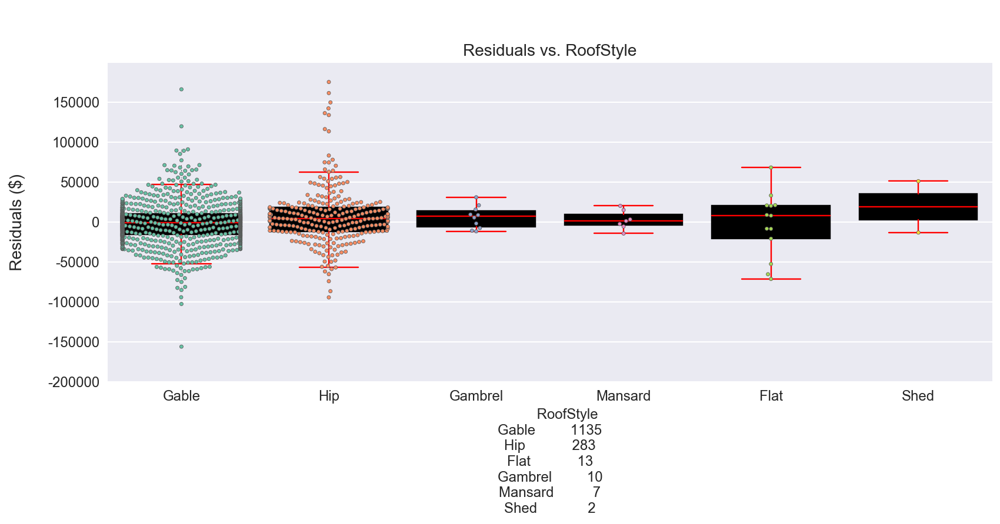

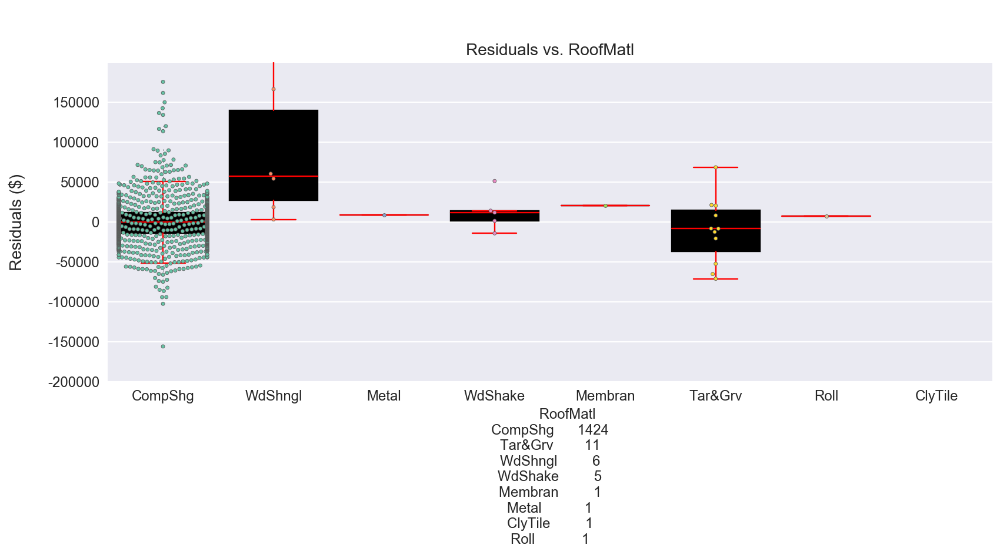

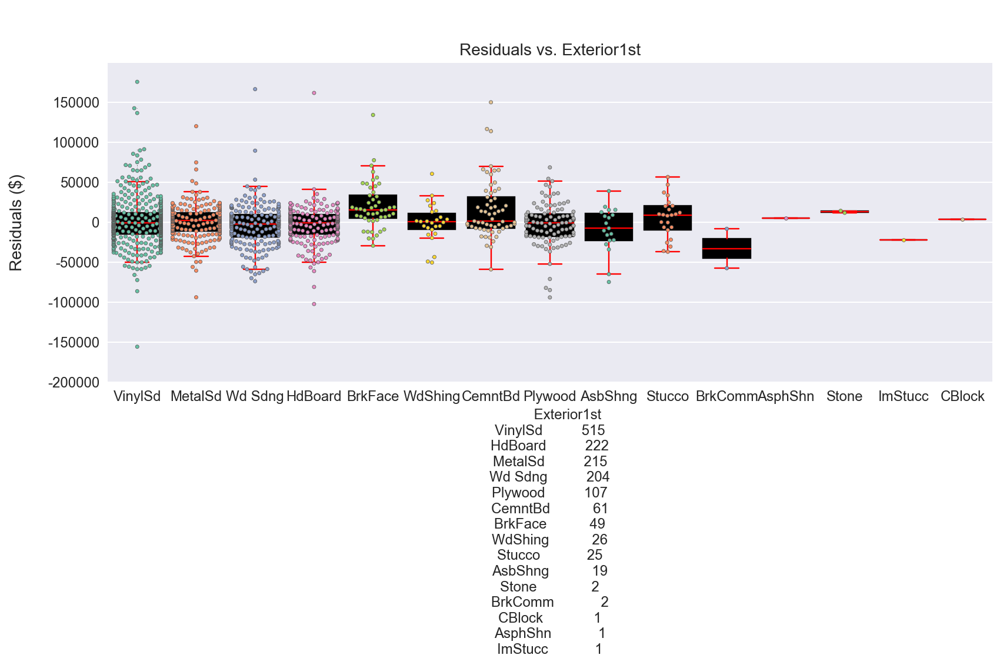

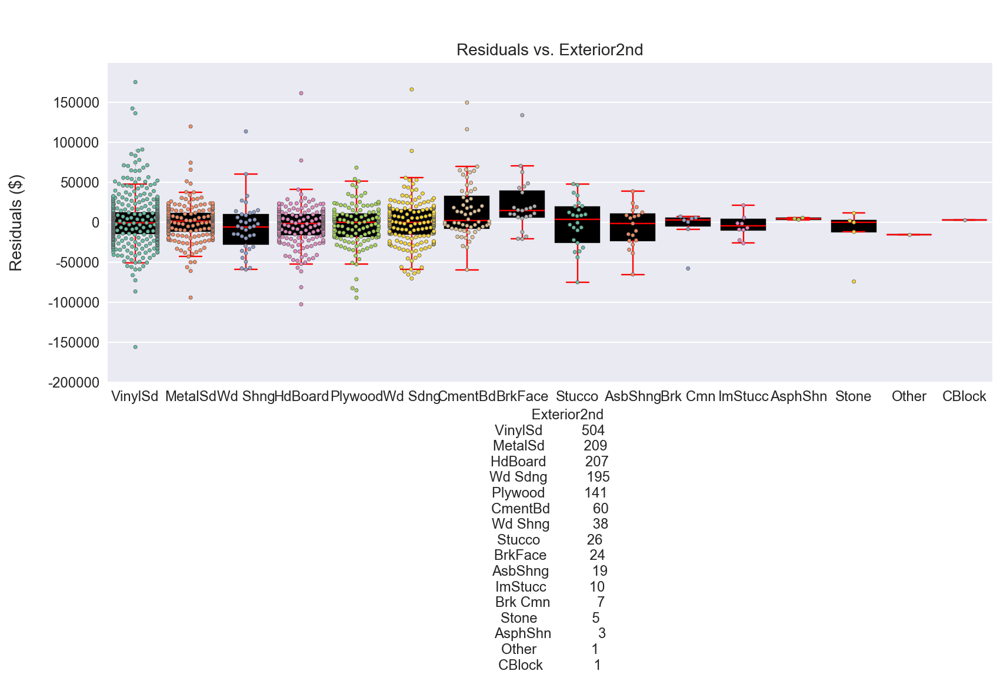

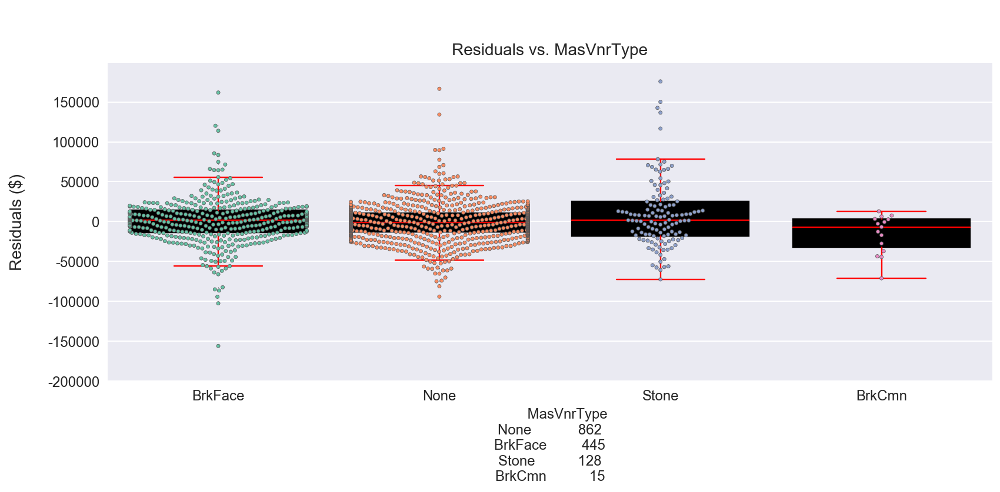

...

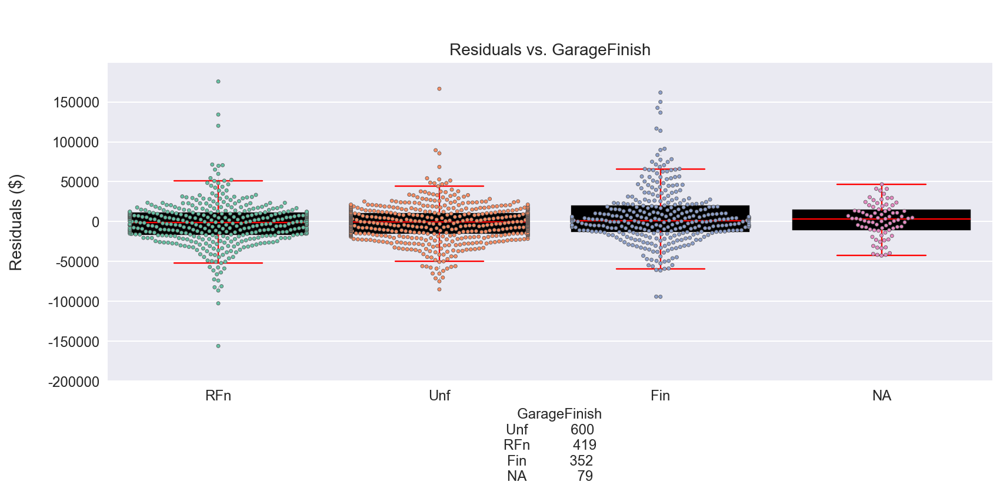

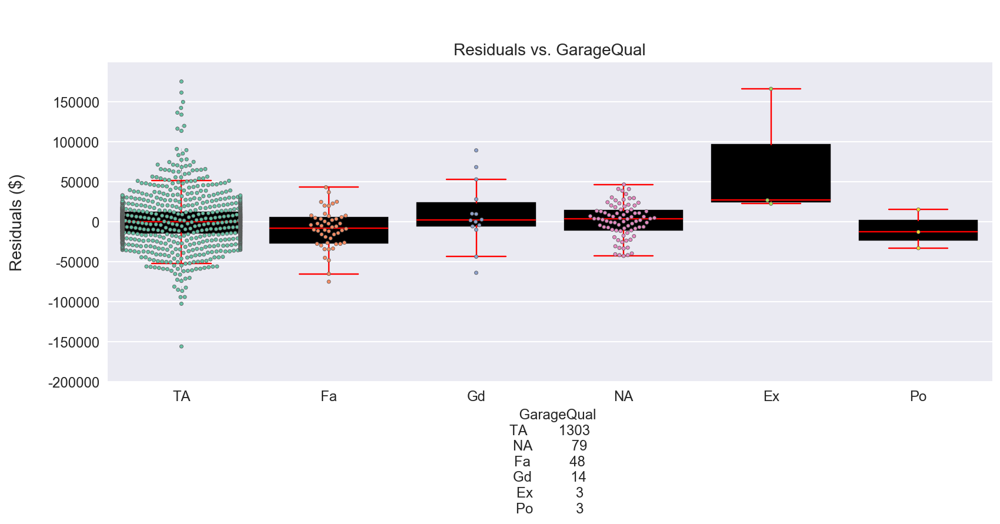

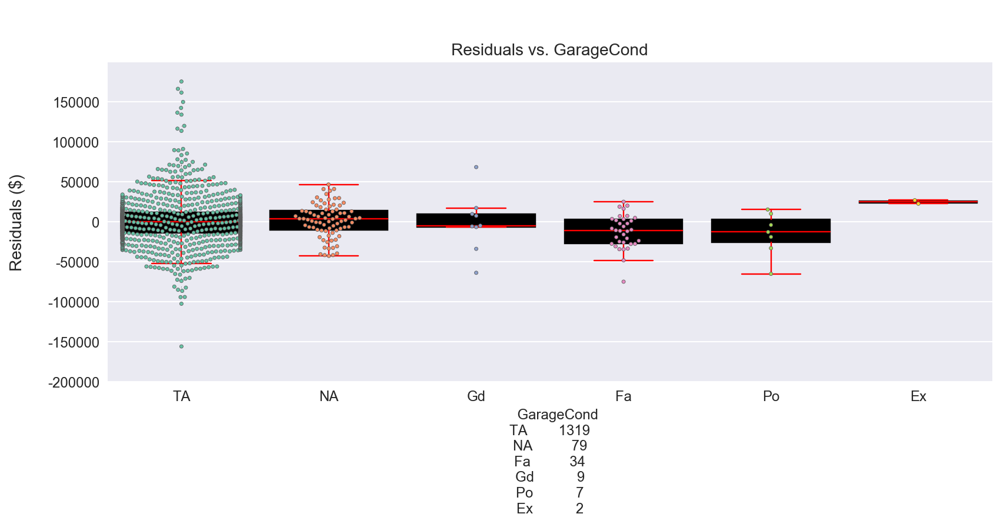

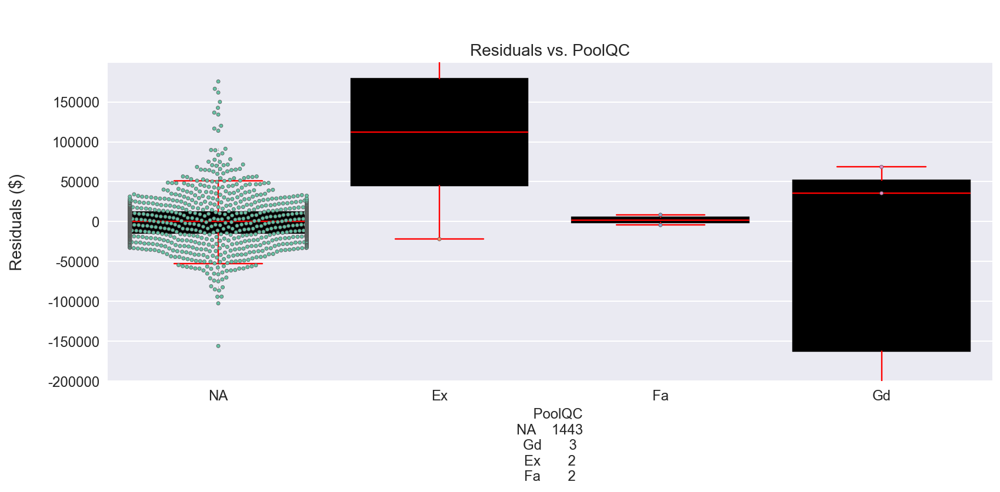

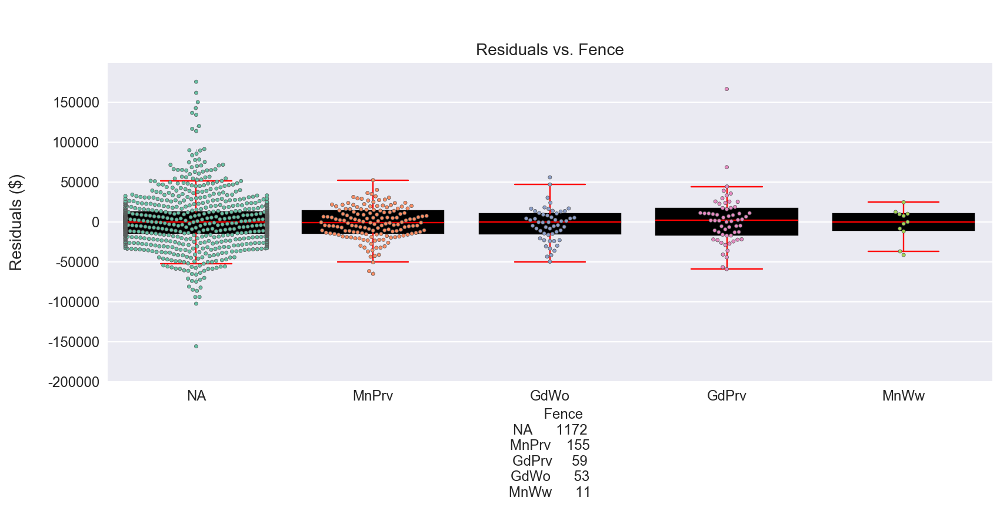

In [176]:
for cat_var in reno_cat_cols_to_eda[:-1]:
    plot_price_boxplot(cat_var, house_reno.loc[:, reno_cat_cols_to_eda], 'Residuals')


As in 1.5.3, I'm looking for categorical variables that demonstrate both: 1) a variation in residuals across their different values, and 2) have a 'reasonable' spread of datapoints across their different values.

There isn't a great deal of variation across these categorical predictors.  The predictors that come closest
to satisfying the 2 criteria above are:
- RoofStyle
- Exterior1st
- Exterior2nd
- BsmtFinType1
- KitchenQual
- Functional
- FirePlaceQual
- GarageQual
- GarageCond

I'm going to include these in my predictor matrix, along with OverallQual and OverallCond.  Even though
the correlation between the residuals and OverallQual and OverallCond is relatively low, it 
feels appropriate that these may contribute to variance/residuals from the predicted sales prices.

### Train and evaluate Linear Regression model to predict sales price residuals

#### Define predictor and target

In [177]:
# Create dictionary look up of column names and indexes from the house_reno df
col_indexes = dict(enumerate(house_reno.columns))
print(col_indexes)

{0: 'OverallQual', 1: 'OverallCond', 2: 'RoofStyle', 3: 'RoofMatl', 4: 'Exterior1st', 5: 'Exterior2nd', 6: 'MasVnrType', 7: 'ExterQual', 8: 'ExterCond', 9: 'BsmtCond', 10: 'BsmtFinType1', 11: 'BsmtFinType2', 12: 'Heating', 13: 'HeatingQC', 14: 'CentralAir', 15: 'Electrical', 16: 'KitchenQual', 17: 'Functional', 18: 'FireplaceQu', 19: 'GarageFinish', 20: 'GarageQual', 21: 'GarageCond', 22: 'PoolQC', 23: 'Fence', 24: 'YrSold', 25: 'SalePrice', 26: 'Predicted SalePrice', 27: 'Residuals'}


In [178]:
# Identify column indexes to include in predictor matrix
predictor_col_indexes = [0, 1, 2, 4, 5, 10, 16, 17, 18, 20, 21]
predictor_col_names = [col_indexes[key] for key in predictor_col_indexes]
print(predictor_col_names)

['OverallQual', 'OverallCond', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'BsmtFinType1', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual', 'GarageCond']


In [179]:
# Define predictor matrix and target array
Xr = house_reno[predictor_col_names]
yr = house_reno['Residuals']

In [180]:
# Dumify categorical variables in predictor data, dropping the first value for each field
Xr_dumified = pd.get_dummies(Xr, drop_first=True)
Xr_dumified.head()

,OverallQual,OverallCond,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageQual_Fa,GarageQual_Gd,GarageQual_NA,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NA,GarageCond_Po,GarageCond_TA
0,7,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1
1,6,8,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1
2,7,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1
3,7,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1
4,8,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1


In [181]:
# Define train and test data sets
Xr_train = Xr_dumified[house_reno['YrSold'] < 2010]  
Xr_test = Xr_dumified[house_reno['YrSold'] == 2010]

yr_train = yr[house_reno['YrSold'] < 2010]
yr_test = yr[house_reno['YrSold'] == 2010]

In [182]:
# Confirm that data types and shape are as expected
print(type(Xr_train), type(Xr_test), type(yr_train), type(yr_test))
print(Xr_train.shape, Xr_test.shape, yr_train.shape, yr_test.shape)

<class 'pandas.core.frame.DataFrame'> <class 'pandas.core.frame.DataFrame'> <class 'pandas.core.series.Series'> <class 'pandas.core.series.Series'>
(1278, 66) (172, 66) (1278,) (172,)


In [183]:
# Standardise my predictor
# Take mean and std of train data only, and transform both train and test data with it
ss = StandardScaler()
ss.fit(Xr_train)
Xr_train_ss = ss.transform(Xr_train)
Xr_test_ss = ss.transform(Xr_test)

In [184]:
# Take a quick look at standardised predictors to ensure no suprises
pd.DataFrame(Xr_train_ss, columns=Xr_dumified.columns).describe()

,OverallQual,OverallCond,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageQual_Fa,GarageQual_Gd,GarageQual_NA,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NA,GarageCond_Po,GarageCond_TA
count,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1278.0,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03
mean,-2.568802e-16,-9.851275e-17,3.949197e-16,-1.983286e-16,3.781534e-16,4.033028e-17,5.065555e-16,0.0,-4.294730e-17,-2.149645e-16,4.945564e-16,-1.582372e-16,5.177566e-17,4.549482e-16,2.378553e-16,4.729307e-16,1.850046e-16,1.247046e-16,-8.070401e-17,-1.078080e-16,8.339703e-17,3.073202e-16,-2.254109e-16,-7.570887e-17,4.945564e-16,6.988845e-17,2.557509e-16,-1.649480e-16,1.215338e-16,5.343165e-17,-3.983077e-16,4.548830e-16,8.535165e-17,-3.466189e-17,-2.597470e-17,2.017166e-16,-1.737438e-18,-4.691083e-17,-9.325700e-17,1.433387e-16,-4.586837e-17,5.090694e-17,7.731600e-18,4.569463e-17,-9.729654e-17,3.072008e-16,-1.203176e-16,-2.573146e-16,-1.885772e-16,-1.606587e-17,-2.234346e-16,-1.315675e-16,6.046285e-17,9.521161e-17,-6.901973e-17,4.387032e-17,-1.655779e-16,5.075491e-17,-1.546754e-16,1.077537e-16,5.359997e-17,2.944089e-16,-1.517652e-16,-1.546754e-16,-1.937244e-17,-1.057231e-16
std,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,0.0,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00
min,-3.713795e+00,-4.153040e+00,-1.887932e+00,-8.421519e-02,-4.955946e-01,-6.267160e-02,-2.798366e-02,0.0,-3.959038e-02,-1.797503e-01,-2.798366e-02,-2.100420e-01,-4.230447e-01,-2.798366e-02,-4.191813e-01,-2.719367e-01,-3.959038e-02,-1.323477e-01,-7.473531e-01,-4.075026e-01

In [185]:
pd.DataFrame(Xr_test_ss, columns=Xr_dumified.columns).describe()

,OverallQual,OverallCond,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageQual_Fa,GarageQual_Gd,GarageQual_NA,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NA,GarageCond_Po,GarageCond_TA
count,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,1.720000e+02,172.000000,172.000000,1.720000e+02,172.000000,172.000000,1.720000e+02,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,1.720000e+02,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,172.000000,172.000000,1.720000e+02,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,1.720000e+02,172.000000,172.000000,1.720000e+02,172.000000,1.720000e+02,172.000000
mean,-0.070211,0.059195,0.037724,-0.014689,-0.042603,0.123594,0.179941,0.005814,-3.959038e-02,0.120757,-2.798366e-02,-0.007734,0.030630,-2.798366e-02,-0.027816,0.164319,-3.959038e-02,0.001749,-0.056258,-0.041500,-0.099271,0.107492,0.016371,0.007944,-2.798366e-02,-0.003879,0.103992,-0.014689,-0.052105,-2.798366e-02,0.142971,-6.267160e-02,-0.052683,-0.093656,-0.040989,0.063008,0.056508,0.138206,0.036960,0.025797,-0.055369,-0.148129,-0.016177,0.060418,-0.016323,-6.267160e-02,-0.030518,0.042829,0.332944,-2.798366e-02,-0.056292,0.048915,-0.148090,0.121974,0.036135,-0.002056,-0.164507,-1.052423e-01,0.047875,-4.850713e-02,0.116689,-0.126149,-8.421519e-02,0.047875,-7.421236e-02,0.080342
std,0.951365,1.042939,0.976155,0.911831,0.968914,1.722300,2.726912,0.076249,1.670197e-16,1.282606,3.479577e-18,0.985081,1.031842,6.959153e-18,0.974706,1.241584,1.670197e-16,1.009407,0.984499,0.958483,0.550581,1.928974,1.115443,1.032750,3.479577e-18,0.993925,1.101775,0.911831,0.947747,1.391831e-17,1.179114,4.175492e-17,0.792052,0.969034,0.957431,1.177780,1.074647,1.059324,1.076036,1.078395,0.919242,0.924169,0.953041,1.013323,1.002863,4.175492e-17,0.896889,1.131440,2.200626,1.391831e-17,1.094646,1.151007,0.910354,1.004673,1.146016,1.001493,0.405125,5.567323e-17,1.093278,2.783661e-17,0.831245,0.480756,3.479577e-16,1.093278,1.391831e-17,0.879233
min,-2.264785,-3.245140,-1.887932,-0.084215,-0.495595,-0.062672,-0.027984,0.000000,-3.959038e-02,-0.179750,-2.798366e-02,-0.210042,-0.423045,-2.798366e-02,-0.419181,-0.271937,-3.959038e-02,-0.132348,-0.747353,-0.407503,-0.141252,-0.039590,-0.068680,-0.129253,-2.798366e-02,-0.208003,-0.400953,-0.084215,-0.414008,-2.798366e-02,-0.318942,-6.267160e-02,-0.138343,-0.738475,-0.397000,-0.160257,-0.332173,-0.625014,-0.229605,-0.160257,-0.317451,-0.655386,-0.162807,-0.817562,-1.004706,-6.267160e-02,-0.149666,-0.152376,-0.084215,-2.798366e-02,-3.722965,-0.149666,-0.606884,-0.927503,-0.116109,-0.524832,-0.195398,-1.052423e-01,-0.237062,-4.850713e-02,-2.909754,-0.162807,-8.421519e-02,-0.237062,-7.421236e-02,-3.120817
25%,-0.815776,-0.521439,0.529680,-0.084215,-0.495595,-0.062

In [186]:
# Standardised predictors look OK.  I will now fit a model to the training data and evaluate it on the test data.

#### Train and evaluate Linear Regression Model

In [187]:
# Start by fitting a linear regression on training data (pre-2010 sales) without 
# any cross-validation or regularization, and evaluate R2 score on both train and test data
lnr_r = LinearRegression()
lnr_r.fit(Xr_train_ss, yr_train)
print(f"R2 score on training data: {round(lnr_r.score(Xr_train_ss, yr_train),3)}")
print(f"R2 score on test data: {round(lnr_r.score(Xr_test_ss, yr_test),3)}")

R2 score on training data: 0.186
R2 score on test data: -8.294518139697144e+21


Model reports a relatively low R2 score on the training data, and an almost 0 R2 score on the test data, 
meaning that the model has not generalised well to the test data.  My guess is that the model has
overfitted the training data.

I'm not suprised that the R2 score is low, given that we're fitting the model to training data that is normally 
distributed around a mean of 0.  We're then testing this model on the residuals from the test data, which 
are distributed around a mean of $1385 (as per section 2.1.1).

I'll now see if I can can get a better prediction of the residual by regularising the model.

##### Lasso regularsation

In [188]:
# Perform a lasso regularisation
lasso_r = LassoCV(n_alphas=150, cv=3)
lasso_r.fit(Xr_train_ss, yr_train)

print('Optimal Lasso R2 score:', round(lasso_r.score(Xr_train_ss, yr_train),3))
print('Best alpha:', round(lasso_r.alpha_,3))

Optimal Lasso R2 score: 0.153
Best alpha: 629.577


In [189]:
# Using the best alpha, cross validate the training data and print the mean R2 score
optimum_lasso_r = Lasso(alpha = lasso_r.alpha_)
print(f'Mean R2 score for optimal Lasso cross validation:', 
      (cross_val_score(optimum_lasso_r, Xr_train_ss, yr_train, cv=3)))

Mean R2 score for optimal Lasso cross validation: [0.12749987 0.11520433 0.07304424]


In [190]:
# Fit optimum lasso on training data, and test it on the testing data
optimum_lasso_r.fit(Xr_train_ss, yr_train)
print('R2 score of optimum Lasso on test data:', round(optimum_lasso_r.score(Xr_test_ss, yr_test),3))

R2 score of optimum Lasso on test data: 0.142


The R2 score on the test data has significantly improved after regularisation, suggesting that the 
Linear Regression model was overfitted to the training data.

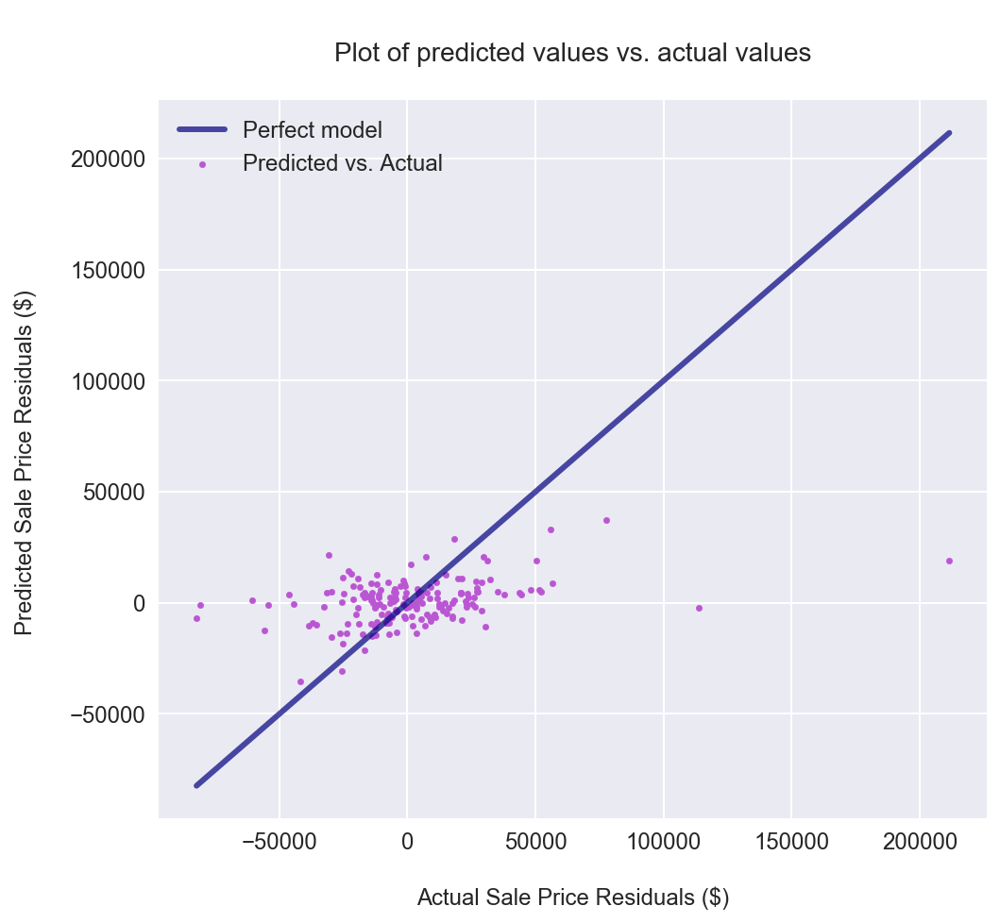

In [191]:
# Plot predictions for test data residuals from optimum lasso model vs actual residuals
predictions_r = optimum_lasso_r.predict(Xr_test_ss)

fig = plt.figure(figsize=(7,7))
ax = plt.gca()

ax.scatter(yr_test, predictions_r, color='mediumorchid', s=10, label='Predicted vs. Actual')

max_val = np.max(yr_test)
min_val = np.min(yr_test)

ax.plot([min_val, max_val], [min_val, max_val], color='navy',
        linewidth=3.0, alpha=0.7, label='Perfect model')
ax.tick_params(labelsize=12)


ax.set_xlabel('\nActual Sale Price Residuals ($)', fontsize=12)
ax.set_ylabel('Predicted Sale Price Residuals ($) \n', fontsize=12)
ax.set_title('\nPlot of predicted values vs. actual values\n', fontsize=14)

plt.legend(loc='upper left', fontsize=12 ) ;

In [192]:
# Look at the predictor coefficients in the Lasso
optimum_lasso_r_coeffs = pd.DataFrame({'variable': Xr_dumified.columns,
                             'coef': optimum_lasso_r.coef_,
                             'abs_coef': np.abs(optimum_lasso_r.coef_)})

optimum_lasso_r_coeffs.sort_values('abs_coef', inplace=True, ascending=False)

In [193]:
# Look at 10 most important/largest coefficients
optimum_lasso_r_coeffs.head(10)

,abs_coef,coef,variable
0,6251.636445,6251.636445,OverallQual
1,4766.043859,4766.043859,OverallCond
43,3814.248953,-3814.248953,KitchenQual_Gd
41,3625.143570,-3625.143570,BsmtFinType1_Unf
50,3008.786624,3008.786624,Functional_Typ
9,3006.327196,3006.327196,Exterior1st_BrkFace
44,1927.588329,-1927.588329,KitchenQual_TA
53,1643.254657,1643.254657,FireplaceQu_NA
32,1235.465308,-1235.465308,Exterior2nd_Stucco
27,1198.228990,1198.228990,Exterior2nd_ImStucc


In [194]:
# Look at 10 least important/smallest coefficients
optimum_lasso_r_coeffs.tail(10)

,abs_coef,coef,variable
21,0.0,-0.0,Exterior2nd_AsphShn
22,0.0,0.0,Exterior2nd_Brk Cmn
24,0.0,0.0,Exterior2nd_CBlock
25,0.0,0.0,Exterior2nd_CmentBd
28,0.0,0.0,Exterior2nd_MetalSd
29,0.0,-0.0,Exterior2nd_Other
30,0.0,-0.0,Exterior2nd_Plywood
34,0.0,0.0,Exterior2nd_Wd Sdng
36,0.0,0.0,BsmtFinType1_BLQ
65,0.0,-0.0,GarageCond_TA


As expected, the Lasso regularisation has zeroed a number of my predictor coefficients.

In [195]:
print(f'Percent of predictor coefficients zeroed out by Lasso regularisation: \
{round((np.sum(optimum_lasso_r.coef_ == 0)/float(Xr_dumified.shape[1])) * 100,2)}%.')

Percent of predictor coefficients zeroed out by Lasso regularisation: 57.58%.


Almost 60% of predictor coefficients were zeroed out by the Lasso regularisation confirming the speculation 
in section 2.4.1 that the model was overfitting the training data.

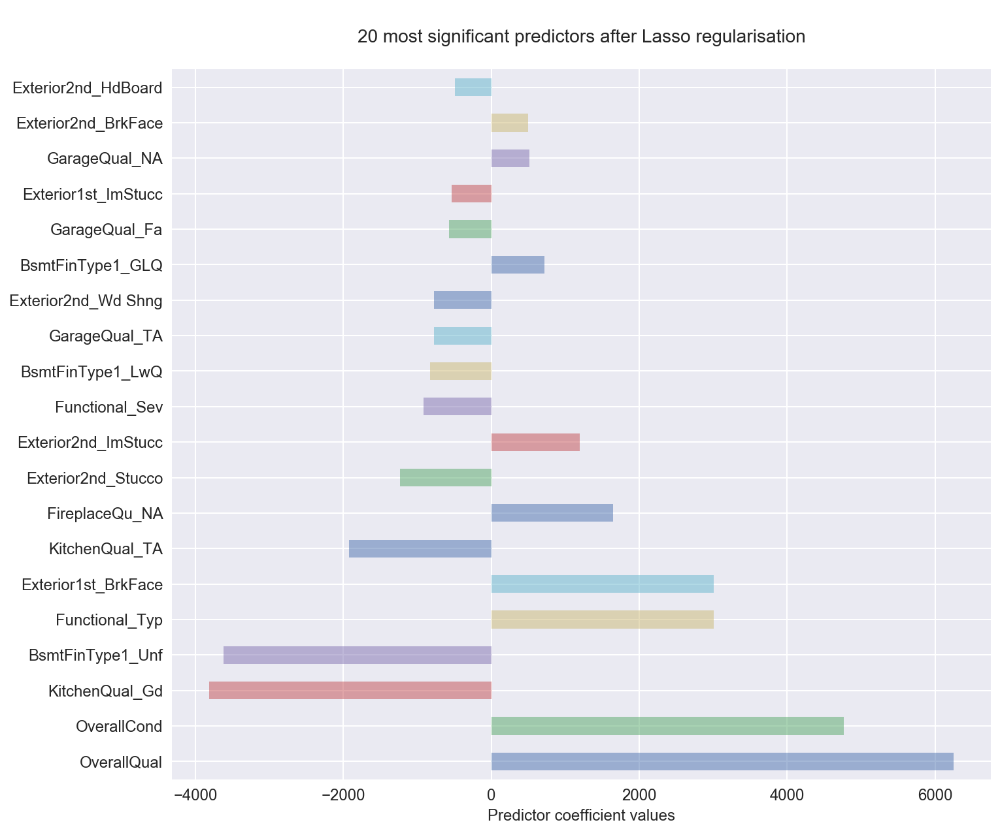

In [196]:
# Plot 20 largest coefficients
fig, ax = plt.subplots(figsize=(10,10))
title = '\n20 most significant predictors after Lasso regularisation\n'
optimum_lasso_r_coeffs.coef[:20].plot(kind='barh', ax=ax, alpha=0.5, fontsize=12)
ax.set_yticklabels(optimum_lasso_r_coeffs.variable[:20].values)
ax.set_xlabel('Predictor coefficient values', fontsize=12)
ax.set_title(title, fontsize=14);


The chart above provides further evidence as to why the model's accuracy in predicting the residuals is relatively poor.  The 2 most important/significant 
predictors are OverallQual and OverallCond which both had a relatively low correlation with the target (residuals) itself!

The predictor coefficients represent the monetary value of renovating a property such that the predictor's value moves 1 std from from it's current mean.  E.g. improve the overall quality of a house by 1 std of the current mean of that value, and you can expect to add $6,000 to the sales price (with a relatively low degress of accuracy given the performance of the model!).

I would trust my first model as a good indicator of which properties to buy (based on their fixed features), however I wouldn't trust a 
model's ability to accurately identify which properties to renovate and how.  Fixed features can be modeled with significantly more accuracy than renovateable features.

<img src="http://imgur.com/GCAf1UX.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 3. What property characteristics predict an "abnormal" sale?

---

The `SaleCondition` feature indicates the circumstances of the house sale. From the data file, we can see that the possibilities are:

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)
       
One of the executives at your company has an "in" with higher-ups at the major regional bank. His friends at the bank have made him a proposal: if he can reliably indicate what features, if any, predict "abnormal" sales (foreclosures, short sales, etc.), then in return the bank will give him first dibs on the pre-auction purchase of those properties (at a dirt-cheap price).

He has tasked you with determining (and adequately validating) which features of a property predict this type of sale. 

---

**Your task:**
1. Determine which features predict the `Abnorml` category in the `SaleCondition` feature.
- Justify your results.

This is a challenging task that tests your ability to perform classification analysis in the face of severe class imbalance. You may find that simply running a classifier on the full dataset to predict the category ends up useless: when there is bad class imbalance classifiers often tend to simply guess the majority class.

It is up to you to determine how you will tackle this problem. It is recommended to do some research to find out how others have dealt with the problem in the past. Make sure to justify your solution. Don't worry about it being "the best" solution, but be rigorous.

Be sure to indicate which features are predictive (if any) and whether they are positive or negative predictors of abnormal sales.

In [197]:
# A:
house['SaleCondition'].value_counts()

Normal     1194
Partial     125
Abnorml      96
Family       20
Alloca       11
AdjLand       4
Name: SaleCondition, dtype: int64

In [198]:
prob_majority_class = house['SaleCondition'].value_counts().max() / house['SaleCondition'].count()

print(f"The baseline accuracy (i.e. probability of predicting the majority class is: \
{round(prob_majority_class,2)}")


The baseline accuracy (i.e. probability of predicting the majority class is: 0.82


In [199]:
prob_abnormal_class = ((house['SaleCondition'] == 'Abnorml').sum()) / house['SaleCondition'].count()

print(f"The baseline accuracy of predicting an Abnormal sale is: \
{round(prob_abnormal_class,2)}")

The baseline accuracy of predicting an Abnormal sale is: 0.07


In [200]:
odds_ratio = prob_abnormal_class / (1 - prob_abnormal_class)

print(f"The odds ratio of a sale being Abnormal sale is: {round(odds_ratio,2)}")


The odds ratio of a sale being Abnormal sale is: 0.07



**********************************************************************************************

I haven't left myself any time to think about this question properly, so am going to conduct a very quick and simple investigation only.

**********************************************************************************************

In [201]:
house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NA,NA,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NA,NA,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NA,NA,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NA,NA,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NA,NA,NaN,0,12,2008,WD,Normal,250000


In [202]:
# Create a very simple predictor matrix, comprising of 1 numeric and 1 categorical column only
X = house[['SalePrice', 'Neighborhood']]
y = house['SaleCondition']

In [203]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450 entries, 0 to 1449
Data columns (total 2 columns):
SalePrice       1450 non-null int64
Neighborhood    1450 non-null object
dtypes: int64(1), object(1)
memory usage: 22.7+ KB


In [204]:
# Dumify Neighbor field in predictor data, dropping the first value for the field
X_dumified = pd.get_dummies(X, drop_first=True)
X_dumified.head()

,SalePrice,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker
0,208500,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,223500,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,140000,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [205]:
# Define train and test data sets
X_train = X_dumified[house['YrSold'] < 2010]  
X_test = X_dumified[house['YrSold'] == 2010]

y_train = y[house['YrSold'] < 2010]
y_test = y[house['YrSold'] == 2010]

In [206]:
# Standardise predictor matrix, using the mean and std from the training data to re-scale all my data
ss = StandardScaler()
ss.fit(X_train) 
X_train_ss = ss.transform(X_train) 
X_test_ss = ss.transform(X_test) 

In [207]:
# Train a KNN model on the train data and evaluate performance
from sklearn.neighbors import KNeighborsClassifier
knn20 = KNeighborsClassifier(n_neighbors = 20)
cross_val_score(knn20, X_train_ss, y_train, cv = 3)

array([0.81308411, 0.82159624, 0.82311321])

In [208]:
# Review values the model is predicting
sale_type_predictions = cross_val_predict(knn20, X_train_ss, y_train, cv=3)
df = pd.DataFrame(sale_type_predictions, columns=['Predictions'])
df['Predictions'].value_counts()

Normal     1261
Partial      17
Name: Predictions, dtype: int64

KNN model above only predicted the 2 most likely sales types ('Normal' and 'Partial').  
I wouldn't expect that increasing the number of neighbours will improve this.  
Will now test with a lower number of neighbors.

In [209]:
knn3 = KNeighborsClassifier(n_neighbors = 3)
cross_val_score(knn3, X_train_ss, y_train, cv = 3)

array([0.73364486, 0.7629108 , 0.75235849])

Scores aren't too bad, given simplicity of the model.

In [210]:
# Review values the model is predicting
sale_type_predictions = cross_val_predict(knn3, X_train_ss, y_train, cv=3)
df = pd.DataFrame(sale_type_predictions, columns=['Predictions'])
df['Predictions'].value_counts()

Normal     1137
Partial      83
Abnorml      44
Alloca        8
AdjLand       4
Family        2
Name: Predictions, dtype: int64

This has resulted in a better distribution of predicted sales types.
I'll now test this evaluate this model on my test data.

In [211]:
knn3.fit(X_train_ss, y_train)
knn3.score(X_test_ss, y_test)

0.8488372093023255

Score is suprisingly(!) good, especially given simplicity of model however the baseline accuracy was 0.82, so the model isn't really doing much better than simply predicting the majority class.

In [212]:
# Make a copy of the test data, and insert the true and predicted sale type
X_test = X_test.copy()
X_test['True sale type'] = y_test
X_test['Predicted sale type'] = knn3.predict(X_test_ss)

In [214]:
X_test.head()


,SalePrice,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,True sale type,Predicted sale type
16,149000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Normal,Normal
24,154000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,Normal,Normal
26,134800,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Normal,Abnorml
27,306000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,Normal,Normal
32,165500,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Normal,Normal


In [216]:
X_test['correct prediction'] = X_test['True sale type'] == X_test['Predicted sale type']
X_test.head()

,SalePrice,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,True sale type,Predicted sale type,correct prediction
16,149000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Normal,Normal,True
24,154000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,Normal,Normal,True
26,134800,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Normal,Abnorml,False
27,306000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,Normal,Normal,True
32,165500,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Normal,Normal,True


In [218]:
X_test['correct prediction'].sum() / len(X_test['correct prediction'])

0.8488372093023255

The sales type was predicted corrected 84% of the time.  Note, this matches the accuracy score calculated above, but is only marginally better than simply predictig the baseline class.